# Задача кредитного скоринга (credit scoring)

Ссылка на датасет -> https://www.kaggle.com/code/gauravduttakiit/risk-analytics-in-banking-financial-services-1/input?select=previous_application.csv

Задача: определить, какие параметры влияют на дефолт человека и понять, каким группам людей стоит давать кредит, а каким нет

In [1]:
# игнорируем ошибки, выводимые Python

import warnings
warnings.filterwarnings('ignore')

In [3]:
# перемещаемся в директорию, теперь мы находимся в ней

import os
os.chdir('C:\\Users\\Admin\\Desktop\\data science\\EDA CASE STUDY')

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [6]:
data = pd.read_csv("application_data.csv")

In [7]:
data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [8]:
# смотрим размеры датасета

data.shape

(307511, 122)

In [9]:
# .drop() - удаляем столбцы (axis=1), где есть такие значения

data.drop(['WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START','EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG',
           'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG','COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG',
           'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 
           'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BUILD_MODE', 
           'COMMONAREA_MODE', 'ELEVATORS_MODE', 'ENTRANCES_MODE', 'FLOORSMAX_MODE', 'FLOORSMIN_MODE', 'LANDAREA_MODE', 'LIVINGAPARTMENTS_MODE', 
           'LIVINGAREA_MODE', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAREA_MODE', 'APARTMENTS_MEDI', 'BASEMENTAREA_MEDI', 'YEARS_BEGINEXPLUATATION_MEDI',
           'YEARS_BUILD_MEDI', 'COMMONAREA_MEDI', 'ELEVATORS_MEDI', 'ENTRANCES_MEDI', 'FLOORSMAX_MEDI', 'FLOORSMIN_MEDI', 'LANDAREA_MEDI', 
           'LIVINGAPARTMENTS_MEDI', 'LIVINGAREA_MEDI', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAREA_MEDI', 'FONDKAPREMONT_MODE',
           'HOUSETYPE_MODE', 'TOTALAREA_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
           'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5',
           'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 
           'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18',
           'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
           'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR', 'OBS_30_CNT_SOCIAL_CIRCLE',
           'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE' ], axis = 1, inplace = True)

In [10]:
data.shape

(307511, 34)

In [11]:
# смотрим, какие столбцы есть, по каким параметрам мы анализируем заёмщика
# сразу смотрим, есть ли пропуски, их можно заполнить модой

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 34 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   SK_ID_CURR                   307511 non-null  int64  
 1   TARGET                       307511 non-null  int64  
 2   NAME_CONTRACT_TYPE           307511 non-null  object 
 3   CODE_GENDER                  307511 non-null  object 
 4   FLAG_OWN_CAR                 307511 non-null  object 
 5   FLAG_OWN_REALTY              307511 non-null  object 
 6   CNT_CHILDREN                 307511 non-null  int64  
 7   AMT_INCOME_TOTAL             307511 non-null  float64
 8   AMT_CREDIT                   307511 non-null  float64
 9   AMT_ANNUITY                  307499 non-null  float64
 10  AMT_GOODS_PRICE              307233 non-null  float64
 11  NAME_TYPE_SUITE              306219 non-null  object 
 12  NAME_INCOME_TYPE             307511 non-null  object 
 13 

In [12]:
# проверяем сколько у нас нулевых значений в каждом столбце

data.isnull().sum()

SK_ID_CURR                          0
TARGET                              0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_OWN_REALTY                     0
CNT_CHILDREN                        0
AMT_INCOME_TOTAL                    0
AMT_CREDIT                          0
AMT_ANNUITY                        12
AMT_GOODS_PRICE                   278
NAME_TYPE_SUITE                  1292
NAME_INCOME_TYPE                    0
NAME_EDUCATION_TYPE                 0
NAME_FAMILY_STATUS                  0
NAME_HOUSING_TYPE                   0
REGION_POPULATION_RELATIVE          0
DAYS_BIRTH                          0
DAYS_EMPLOYED                       0
DAYS_REGISTRATION                   0
DAYS_ID_PUBLISH                     0
OWN_CAR_AGE                    202929
OCCUPATION_TYPE                 96391
CNT_FAM_MEMBERS                     2
REGION_RATING_CLIENT                0
REGION_RATING_CLIENT_W_CITY         0
REG_REGION_N

In [13]:
# data.shape[0] - количество строк
# проверяем, какую долю от всех строк занимают нулевые значения в каждой конкретной строке

data_null_value_percentage = data.isnull().sum()/data.shape[0]*100
data_null_value_percentage

SK_ID_CURR                      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR                    0.000000
FLAG_OWN_REALTY                 0.000000
CNT_CHILDREN                    0.000000
AMT_INCOME_TOTAL                0.000000
AMT_CREDIT                      0.000000
AMT_ANNUITY                     0.003902
AMT_GOODS_PRICE                 0.090403
NAME_TYPE_SUITE                 0.420148
NAME_INCOME_TYPE                0.000000
NAME_EDUCATION_TYPE             0.000000
NAME_FAMILY_STATUS              0.000000
NAME_HOUSING_TYPE               0.000000
REGION_POPULATION_RELATIVE      0.000000
DAYS_BIRTH                      0.000000
DAYS_EMPLOYED                   0.000000
DAYS_REGISTRATION               0.000000
DAYS_ID_PUBLISH                 0.000000
OWN_CAR_AGE                    65.990810
OCCUPATION_TYPE                31.345545
CNT_FAM_MEMBERS                 0.000650
REGION_RATING_CL

- можно удалить столбец 'OWN_CAR_AGE', поскольку он содержит большую долю нулевых значений
- Столбцы с именами 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'DAYS_LAST_PHONE_CHANGE' и 'CNT_FAM_MEMBERS' имеют очень меньшее количество нулевых значений, и эти столбцы содержат числовые переменные, поэтому нам нужно либо заменить их средним значением или медианой в зависимости от наличия выбросов, либо удалить строки, если стандартное отклонение велико. Чтобы подтвердить наличие выбросов, мы находим 95-й и 99-й процентили и сравниваем их с максимальным значением.
- Категориальные столбцы "NAME_INCOME_TYPE" и "OCCUPATION_TYPE" содержат менее 50% нулевых значений, но все равно содержат значительное количество нулевых значений. В этом случае мы можем создать другой уровень для отсутствующих категориальных данных, потому что иногда лучше оставить отсутствующие значения и продолжить анализ, так как добавление значения к данным - это хорошо, но преувеличение - плохо.

In [34]:
# удаляем столбец "OWN_CAR_AGE"

data.drop('OWN_CAR_AGE', axis = 1, inplace = True)

In [35]:
def analysing(column):
    return pd.DataFrame({'statistical terms': ['95th percentile', 
                                               '99th percentile', 'max_value', 
                                               'Standard_Deviation', 
                                               'median'],
                         'values': [column.quantile(0.95), 
                                    column.quantile(0.99),
                                    column.max(), 
                                    column.std(), 
                                    column.median()]})

df_quantile_Family_Members = analysing(data.CNT_FAM_MEMBERS)
df_quantile_Family_Members

,statistical terms,values
0,95th percentile,4.000000
1,99th percentile,5.000000
2,max_value,20.000000
3,Standard_Deviation,0.910682
4,median,2.000000


- Поскольку существует существенная разница между 95-м/99-м значениями и максимальным значением, мы можем заключить, что в столбце CNT_FAM_MEMBERS есть выбросы, а во-вторых, в этих значениях нет как такового отклонения.
- Поэтому мы можем заменить нулевые значения медианой.

In [36]:
df_quantile_AMT_ANNUITY = analysing(data.AMT_ANNUITY)
df_quantile_AMT_ANNUITY

,statistical terms,values
0,95th percentile,53325.000000
1,99th percentile,70006.500000
2,max_value,258025.500000
3,Standard_Deviation,14493.737315
4,median,24903.000000


- Поскольку существует существенная разница между 95-м/99-м значениями и максимальным значением, мы можем заключить, что в столбце AMT_ANNUITY есть выбросы.
- Поскольку стандартное отклонение велико, данные широко распространены.
- В таких условиях желательно удалить строки с нулевыми значениями в соответствующих столбцах.

In [37]:
df_quantile_AMT_GOODS_PRICE = analysing(data.AMT_GOODS_PRICE)
df_quantile_AMT_GOODS_PRICE

,statistical terms,values
0,95th percentile,1.305000e+06
1,99th percentile,1.800000e+06
2,max_value,4.050000e+06
3,Standard_Deviation,3.694465e+05
4,median,4.500000e+05


- Поскольку существует значительная разница между 99-м значением и максимальным значением, мы можем заключить, что в столбце AMT_GOODS_PRICE есть выбросы, и, во-вторых, существует более высокое отклонение значений, поскольку стандартное отклонение велико.
- Мы можем удалить строки с нулевыми значениями в соответствующих столбцах.

In [38]:
df_quantile_DAYS_LAST_PHONE_CHANGE = analysing(data.DAYS_LAST_PHONE_CHANGE)
df_quantile_DAYS_LAST_PHONE_CHANGE

,statistical terms,values
0,95th percentile,0.000000
1,99th percentile,0.000000
2,max_value,0.000000
3,Standard_Deviation,826.808487
4,median,-757.000000


- Стандартное отклонение велико, поэтому мы не можем сопоставить нулевые значения с медианой.
- Мы также заметили, что в этом столбце есть только одно нулевое значение, поэтому рекомендуется удалить эту запись.

In [39]:
data.shape

(307511, 35)

In [40]:
data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,DAYS_LAST_PHONE_CHANGE
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307510.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,2.152665,2.052463,2.031521,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,-962.858788
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,1509.450419,0.910682,0.509034,0.502737,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,826.808487
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,-4299.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1570.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,-3254.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-757.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,-1720.000000,3.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-274.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,0.000000,20.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


In [41]:
data["DAYS_BIRTH"] = abs(data.DAYS_BIRTH)/365
data["DAYS_EMPLOYED"] = abs(data.DAYS_EMPLOYED)/365
data["DAYS_REGISTRATION"] = abs(data.DAYS_REGISTRATION)/365
data["DAYS_ID_PUBLISH"] = abs(data.DAYS_ID_PUBLISH)/365
data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,DAYS_LAST_PHONE_CHANGE
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307510.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,43.936973,185.547239,13.660604,8.203294,2.152665,2.052463,2.031521,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,-962.858788
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,11.956133,382.037676,9.651743,4.135481,0.910682,0.509034,0.502737,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,826.808487
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,20.517808,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,34.008219,2.556164,5.506849,4.712329,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1570.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,43.150685,6.079452,12.339726,8.915068,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-757.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,53.923288,15.635616,20.491781,11.778082,3.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-274.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,69.120548,1000.665753,67.594521,19.717808,20.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


In [35]:
# удаляем столбец "OWN_CAR_AGE"
# Dropping "OWN_CAR_AGE" column
data.drop('OWN_CAR_AGE', axis = 1, inplace = True)

In [23]:
# Analysing 'CNT_FAM_MEMBERS' Column
def analysing(column):
    return pd.DataFrame({'statistical terms': ['95th percentile', 
                                               '99th percentile', 'max_value', 
                                               'Standard_Deviation', 
                                               'median'],
                         'values': [column.quantile(0.95), 
                                    column.quantile(0.99),
                                    column.max(), 
                                    column.std(), 
                                    column.median()]})

df_quantile_Family_Members = analysing(data.CNT_FAM_MEMBERS)
df_quantile_Family_Members

,statistical terms,values
0,95th percentile,4.000000
1,99th percentile,5.000000
2,max_value,20.000000
3,Standard_Deviation,0.910682
4,median,2.000000


- Поскольку существует существенная разница между 95-м/99-м значениями и максимальным значением, мы можем заключить, что в столбце CNT_FAM_MEMBERS есть выбросы, а во-вторых, в этих значениях нет как такового отклонения.
- Поэтому мы можем заменить нулевые значения медианой.

In [26]:
df_quantile_AMT_ANNUITY = analysing(data.AMT_ANNUITY)
df_quantile_AMT_ANNUITY

,statistical terms,values
0,95th percentile,53325.000000
1,99th percentile,70006.500000
2,max_value,258025.500000
3,Standard_Deviation,14493.737315
4,median,24903.000000


- Поскольку существует существенная разница между 95-м/99-м значениями и максимальным значением, мы можем заключить, что в столбце AMT_ANNUITY есть выбросы.
- Поскольку стандартное отклонение велико, данные широко распространены.
- В таких условиях желательно удалить строки с нулевыми значениями в соответствующих столбцах.

In [27]:
df_quantile_AMT_GOODS_PRICE = analysing(data.AMT_GOODS_PRICE)
df_quantile_AMT_GOODS_PRICE

,statistical terms,values
0,95th percentile,1.305000e+06
1,99th percentile,1.800000e+06
2,max_value,4.050000e+06
3,Standard_Deviation,3.694465e+05
4,median,4.500000e+05


- Поскольку существует значительная разница между 99-м значением и максимальным значением, мы можем заключить, что в столбце AMT_GOODS_PRICE есть выбросы, и, во-вторых, существует более высокое отклонение значений, поскольку стандартное отклонение велико.
- Мы можем удалить строки с нулевыми значениями в соответствующих столбцах.

In [28]:
df_quantile_DAYS_LAST_PHONE_CHANGE = analysing(data.DAYS_LAST_PHONE_CHANGE)
df_quantile_DAYS_LAST_PHONE_CHANGE

,statistical terms,values
0,95th percentile,0.000000
1,99th percentile,0.000000
2,max_value,0.000000
3,Standard_Deviation,826.808487
4,median,-757.000000


- Стандартное отклонение велико, поэтому мы не можем сопоставить нулевые значения с медианой.
- Мы также заметили, что в этом столбце есть только одно нулевое значение, поэтому рекомендуется удалить эту запись.

In [27]:
#Checking the shape of the updated Dataset.
data.shape

(307511, 33)

In [29]:
# выводим краткую информацию по каждому столбцу
# Describing the data 
data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,DAYS_LAST_PHONE_CHANGE
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307510.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,2.152665,2.052463,2.031521,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,-962.858788
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,1509.450419,11.944812,0.910682,0.509034,0.502737,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,826.808487
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,-4299.000000,5.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1570.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,-3254.000000,9.000000,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-757.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,-1720.000000,15.000000,3.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-274.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,0.000000,91.000000,20.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


In [36]:
# Standardizing the DAYS_BIRTH Column, DAYS_REGISTRATION,DAYS_ID_PUBLISH .
data["DAYS_BIRTH"] = abs(data.DAYS_BIRTH)/365
data["DAYS_EMPLOYED"] = abs(data.DAYS_EMPLOYED)/365
data["DAYS_REGISTRATION"] = abs(data.DAYS_REGISTRATION)/365
data["DAYS_ID_PUBLISH"] = abs(data.DAYS_ID_PUBLISH)/365
data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,DAYS_LAST_PHONE_CHANGE
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307510.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,43.936973,185.547239,13.660604,8.203294,2.152665,2.052463,2.031521,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,-962.858788
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,11.956133,382.037676,9.651743,4.135481,0.910682,0.509034,0.502737,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,826.808487
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,20.517808,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,34.008219,2.556164,5.506849,4.712329,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1570.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,43.150685,6.079452,12.339726,8.915068,2.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-757.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,53.923288,15.635616,20.491781,11.778082,3.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-274.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,69.120548,1000.665753,67.594521,19.717808,20.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000


## ИЗУЧЕНИЕ ВЫБРОСОВ И РАСПРЕДЕЛЕНИЯ ДАННЫХ

In [14]:
def box_plot(VAR):
    plt.figure(figsize = [10,5])
    g = sns.catplot(x="TARGET",
    y=VAR,
    kind="box",
    data=data)
    plt.show()

<Figure size 1000x500 with 0 Axes>

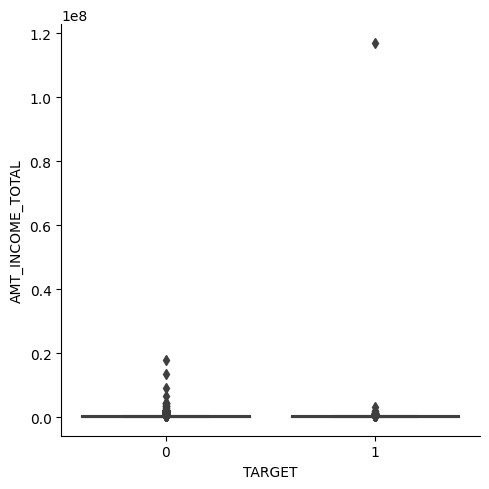

In [15]:
# AMT_INCOME_TOTAL - Суммарный доход

box_plot("AMT_INCOME_TOTAL")

- Из приведенного выше графика мы можем наблюдать, что существуют выбросы, соответствующие как TARGET = 0, так и TARGET = 1.
- В TARGET = 1 есть одно экстремальное значение, желательно исключить этот выброс.
- Столбец AMT_INCOME_TOTAL является столбцом непрерывной переменной, поэтому мы можем привязывать значения, не влияя на наш анализ.

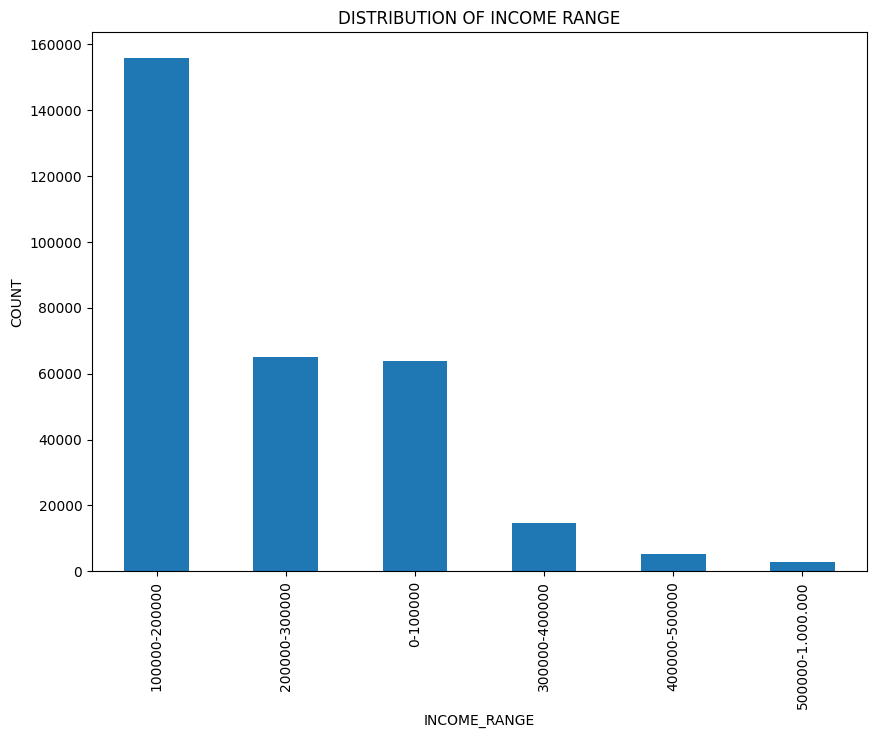

In [16]:
def distribution(column):
    plt.figure(figsize=[10,7])
    data[f"{column}_Range"] = pd.cut(data[column], 
                                            bins= [0,100000,200000,300000,400000,500000,10000000000], 
                                            labels = ["0-100000","100000-200000","200000-300000",
                                                      "300000-400000","400000-500000","500000-1.000.000"]).value_counts().plot(kind = "bar")    
    plt.xlabel("INCOME_RANGE")
    plt.ylabel("COUNT")
    plt.title("DISTRIBUTION OF INCOME RANGE")
    plt.show()

distribution("AMT_INCOME_TOTAL")

- Мы можем наблюдать, что большинство клиентов находятся в диапазоне доходов 100000-200000, за которыми следуют 200000-300000, затем 0-100000 и т.д.

<Figure size 1000x500 with 0 Axes>

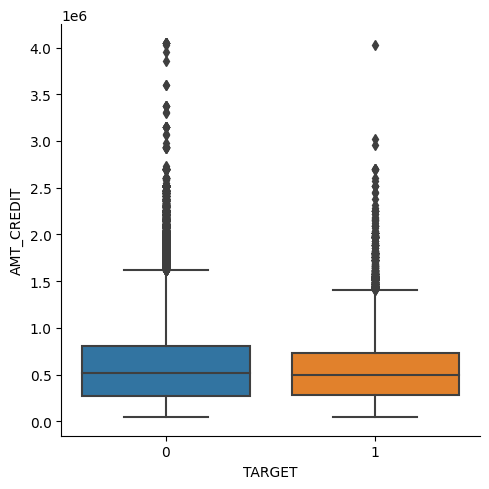

In [17]:
# AMT_CREDIT - Сумма кредита

box_plot("AMT_CREDIT")

- Как мы отмечали ранее, AMT_CREDIT также является столбцом непрерывной переменной, поэтому мы можем привязывать значения, не влияя на наш анализ.

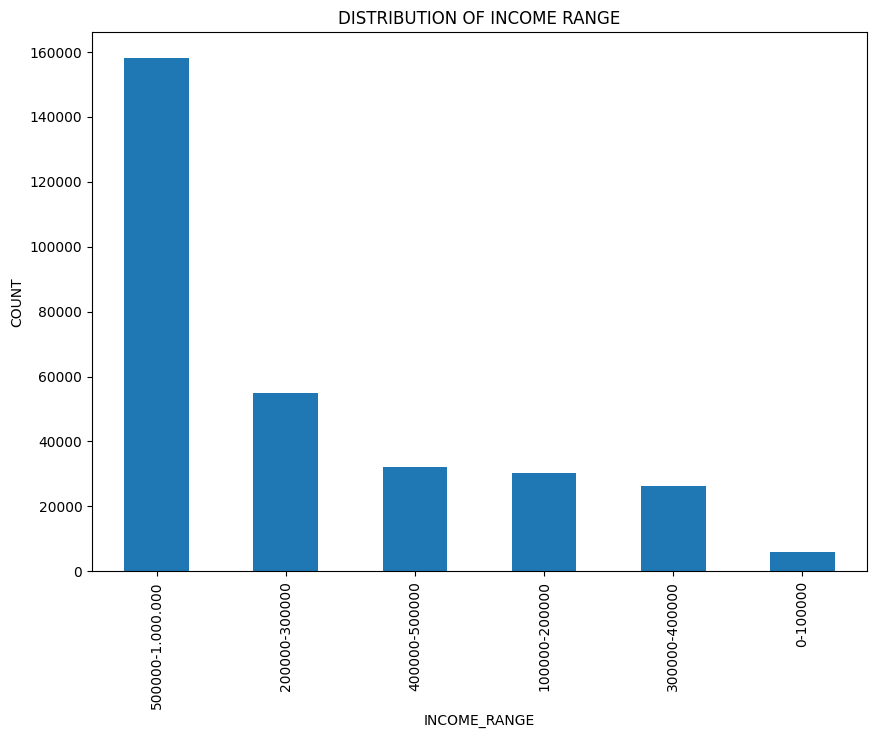

In [18]:
# Сумма кредита

distribution("AMT_CREDIT")

- Большинство, если клиенты находятся в кредитном диапазоне 500000 - самая высокая стоимость кредита, за которой следуют 200000-300000 и 400000-500000.

<Figure size 1000x500 with 0 Axes>

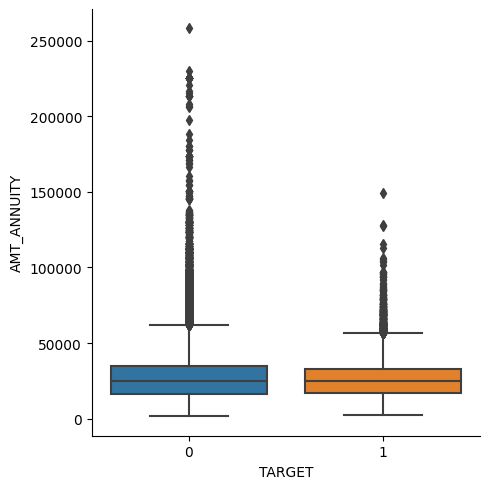

In [19]:
# Сумма аннуитета - сумма ежемесячной платы (AMT_ANNUITY)

box_plot("AMT_ANNUITY")

- AMT_ANNUITY также является столбцом непрерывной переменной, поэтому мы можем продолжить, связав значения.
- Мы не можем просто вычислить значения, такие как среднее значение / медиана, так как это может привести к отклонению результата нашего анализа.

<Figure size 1000x500 with 0 Axes>

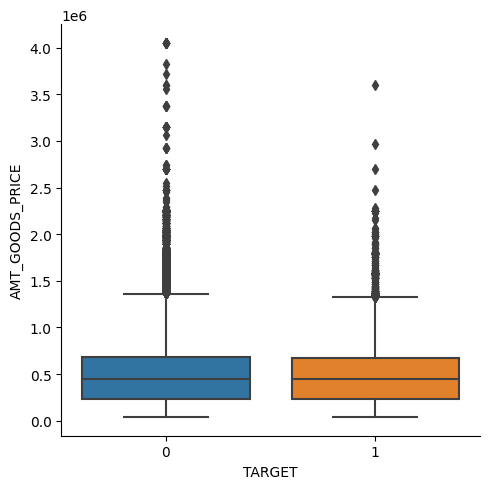

In [20]:
# Стоимость товара (AMT_GOODS_PRICE)

box_plot("AMT_GOODS_PRICE")

- AMT_GOODS_PRICE также является столбцом непрерывной переменной, поэтому мы можем продолжить, объединив значения.
- Мы не можем просто вычислить значения, такие как среднее значение / медиана, так как это может привести к отклонению результата нашего анализа.

<Figure size 1000x500 with 0 Axes>

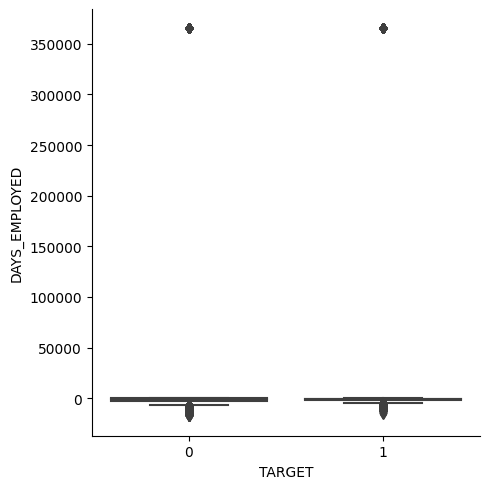

In [21]:
# трудовой стаж (DAYS_EMPLOYED)

box_plot("DAYS_EMPLOYED")

- Мы можем наблюдать, что в столбце DAYS_EMPLOYED присутствуют экстремальные выбросы.
- Данные, по-видимому, неверны, поскольку невозможно, чтобы количество дней, затраченных на клиента, составляло 350000, что приблизительно равно 958 годам.
- Выбросы присутствуют из-за ошибок, допущенных при вводе значений.
- Мы должны наблюдать за количеством выбросов, если таких наблюдений больше, то лучше удалить столбец, а если обнаружено всего несколько выбросов, то мы можем сопоставить значение выбросов со средним значением.

<Figure size 1000x500 with 0 Axes>

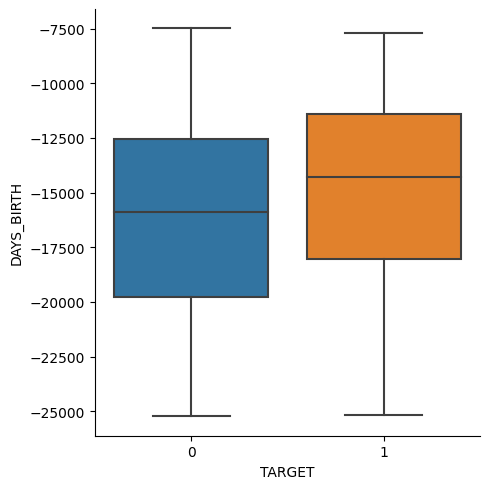

In [22]:
# дни рождения (AMT_GOODS_PRICE)

box_plot("DAYS_BIRTH")

- Приведенные выше данные были преобразованы из дней в годы.
- Совершенно очевидно, что в данных DAYS_BIRTH отсутствуют какие-либо выбросы.
- Поскольку медиана и IQR ниже для TARGET=1, мы можем заключить, что более молодые клиенты с большей вероятностью допустят дефолт.

<Figure size 1000x500 with 0 Axes>

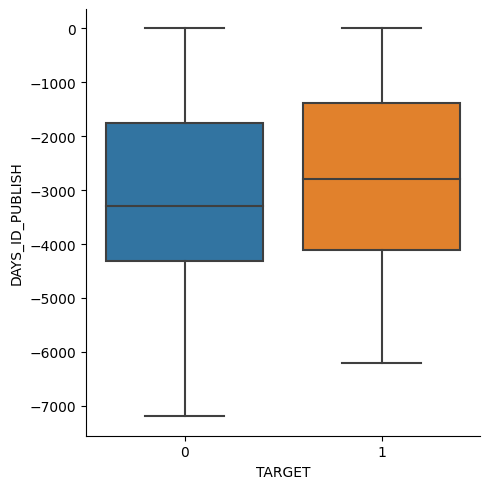

In [23]:
# дней с момента подачи документов (AMT_GOODS_PRICE)
box_plot("DAYS_ID_PUBLISH")

- Совершенно очевидно, что в данных DAYS_ID_PUBLISH нет выбросов.

## АНАЛИЗ ДАННЫХ

In [24]:
# Проверка дисбаланса данных

data.TARGET.value_counts(normalize=True) 

TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

- Данные сильно несбалансированы, где 91,9% переменной "ЦЕЛЬ" равно 0 (другие случаи/отсутствие трудностей), а 8,1% переменной "ЦЕЛЬ" равно 1 (трудности с погашением).

In [25]:
# Developing a function to perform efficient univariate analysis of categorical variables:
def bar_plot(Attribute, hori = True, rot = False):
    variable = data[Attribute].value_counts(normalize = True)
    Variable_Data_Percentage = data.groupby(data[Attribute]).mean()
    Variable_Data_plot = Variable_Data_Percentage['TARGET']
   
    if hori:
        plt.figure(figsize=[15,7])
        plt.subplot(1,2,1)
        sns.barplot(x = variable.index, y = variable.values, palette= 'magma')
        plt.xlabel(Attribute)
        plt.ylabel("Percentage of Applicants")
        if rot:
            plt.xticks(rotation = 90)    
        plt.subplot(1,2,2)
        sns.barplot(x = Variable_Data_plot.index, y = Variable_Data_plot.values, palette= 'magma')
        plt.xlabel(Attribute)
        plt.ylabel("Percentage of clients having difficulty in repaying loan")
        if rot:
            plt.xticks(rotation = 90)
        plt.show()
    else:
        plt.figure(figsize=[14,20])
        plt.subplot(2,1,1)
        sns.barplot(x = variable.index, y = variable.values, palette= 'magma')
        plt.xlabel(Attribute)
        plt.ylabel("Percentage of Applicants")
        if rot:
            plt.xticks(rotation = 90)
        
        plt.subplot(2,1,2)
        sns.barplot(x =  Variable_Data_plot.index, y =  Variable_Data_plot.values, palette= 'magma')
        plt.xlabel(Attribute)
        plt.ylabel("Percentage of clients having difficulty in repaying loan")
        if rot:
            plt.xticks(rotation = 90)
        plt.show()

In [44]:
# BarPlots for NAME_CONTRACT_TYPE
bar_plot("NAME_CONTRACT_TYPE")

NameError: name 'Variable_Data_Percentage' is not defined

### From the above plots the following inferences can be made:
1. Major portion of the clients have opted for Cash loans(Approximately 85-90%), whereas 10-15% have opted for Revolving loans.
2. The mean for Cash loans is approximately 8.5%, whereas for revolving loans it is approximately 5.5%. This shows that the clients who have opted for cash loans are more likely to default.

In [46]:
# BarPlots for CODE_GENDER
bar_plot('CODE_GENDER')

TypeError: agg function failed [how->mean,dtype->object]

### From the above plots the following inferences can be made:
1. There are considerably more female clients (approximately 65%) than male clients (approximately 35%)
2. Male clients are more likely to default (approximately 10%) when compared to female clients (approximately 7%)

In [46]:
# BarPlots for FLAG_OWN_CAR
bar_plot("FLAG_OWN_CAR")

TypeError: agg function failed [how->mean,dtype->object]

### From the above plots the following inferences can be made:

1. Majority of the loan clients do not own a car (approximately 65-70%), whereas approximately 30-35% of them own one or more cars.
2. The clients who do not own a car are more likely to default (approximately 8.5%) than the clients who own one or more cars (approximately 7%)

In [47]:
# BarPlots for FLAG_OWN_REALTY
bar_plot("FLAG_OWN_REALTY")

TypeError: agg function failed [how->mean,dtype->object]

### From the above plots the following inferences can be made:
1. Majority of the clients own realty (approximately 70%), whereas approximately 30% of them do not own realty.
2. Surprisingly the clients who own realty have a higher chance of not returning their loans (approximately 5.5%) as opposed to clients who do not own realty (approximately 2.5%)

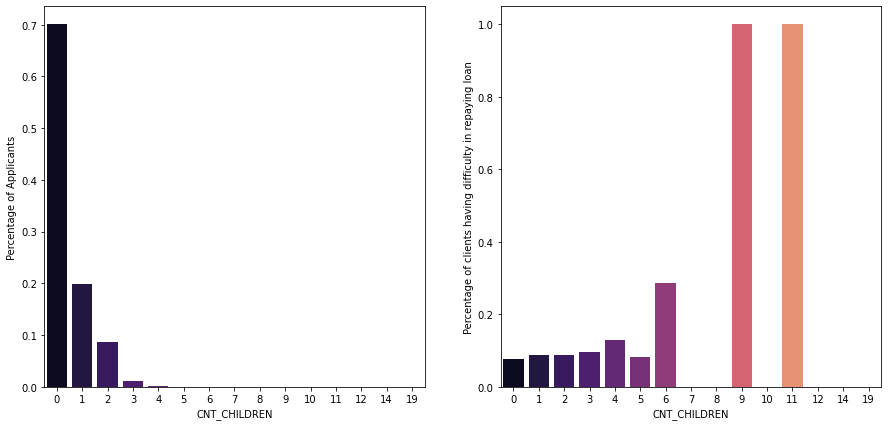

In [36]:
# BarPlots for CNT_CHILDREN
bar_plot("CNT_CHILDREN")

### From the above plots the following inferences can be made:
1. Majority of the clients do not have children (approximately 70%), and about 20% of the applicants have 1 child and less than 10% of the clients have 2 children.
2. Looks like the chances of not repaying the loan increases with the number of children the clients has. And the clients who have 9 or 11 children have approximately 100% chance of defaulting.

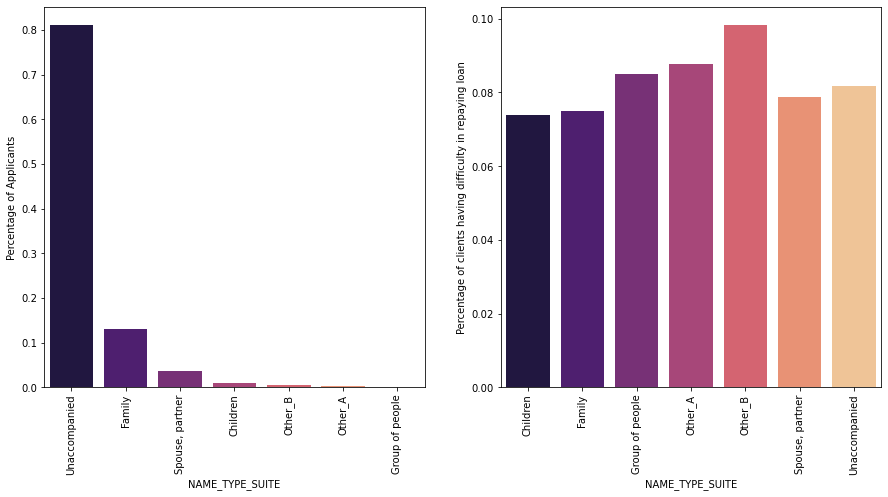

In [37]:
# BarPlots for NAME_TYPE_SUITE
bar_plot("NAME_TYPE_SUITE", rot = True)

### From the above plots the following inferences can be made:
1. Most of the clients were unaccompanied while applying for the loan (~80%), about 10-15% of the clients were with their families while applying, about 5% of them were accompanied by their spouse.
2. Approximately all these categories have the same default rate, therefore the people who accompany the client while applying for the loan does not play a big role in deciding whether he/she defaults the loan.

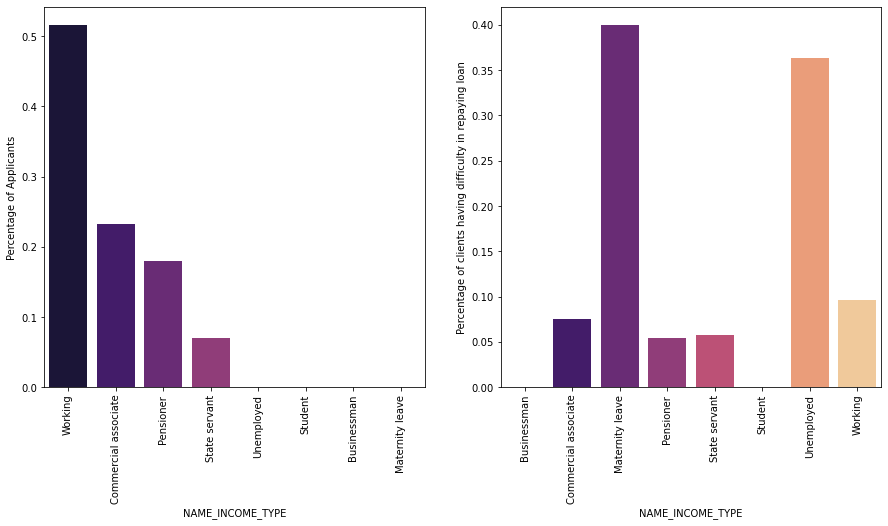

In [38]:
# BarPlots for NAME_INCOME_TYPE
bar_plot("NAME_INCOME_TYPE", rot = True)

### From the above plots the following inferences can be made:
1. More than half of the clients are working, about 20-25% are commercial associates, nearly 20% are pensioners and nearly 10% are state servants.
2. Clients who are on maternity leave and unemployed clients are most likely to default (approximately 35-40%), the remaining income types have around 10% chance of defaulting.

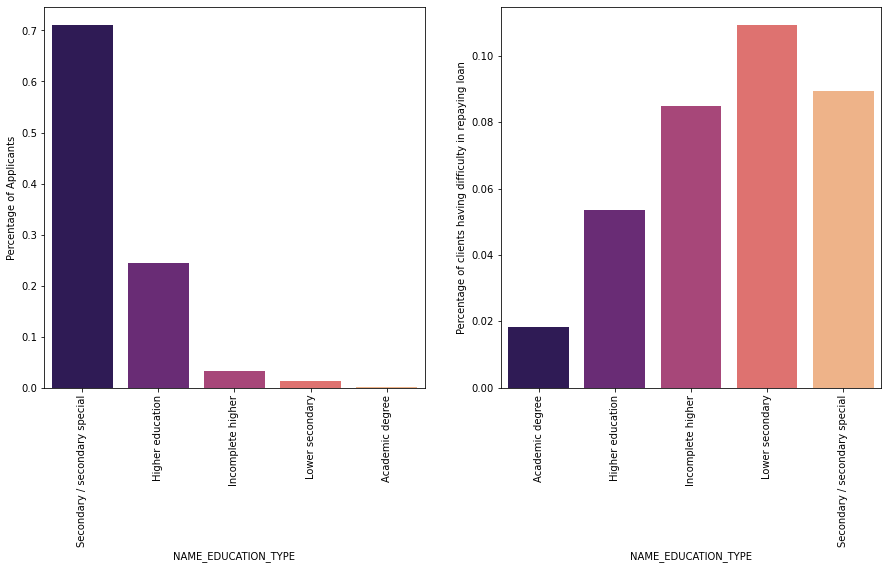

In [39]:
# BarPlots for NAME_EDUCATION_TYPE
bar_plot("NAME_EDUCATION_TYPE", rot = True)

### From the above plots the following inferences can be made:
1. Majority of the clients have completed Secondary education (~70%), followed by clients who have completed higher education (about 25%), followed by incomplete higher education and lower secondary education.
2. Clients who have have completed lower secondary education are most likely to default (around 10%), followed by incomplete higher (around 8%) and secondary education (around 8%), and the clients who have an academic degree are least likely to default (nearly 2%)

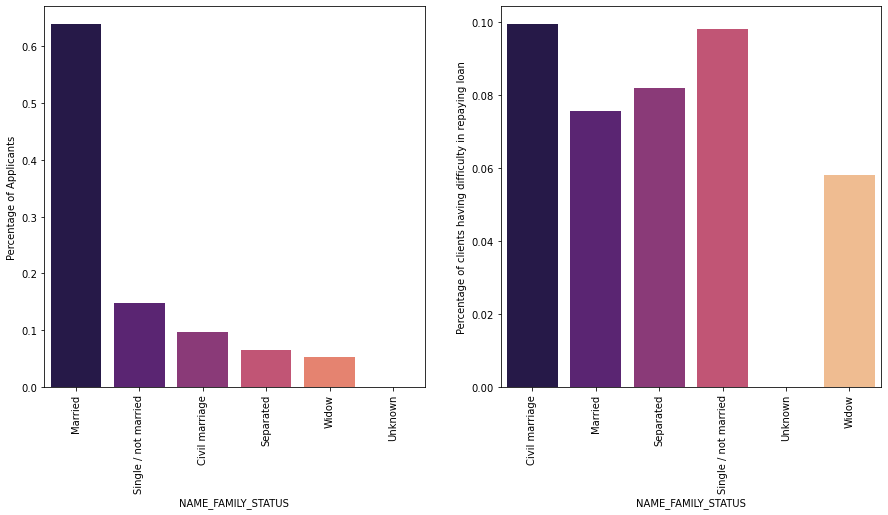

In [40]:
# BarPlots for NAME_FAMILY_STATUS
bar_plot("NAME_FAMILY_STATUS", rot = True)

### From the above plots the following inferences can be made:
1. More than half of the clients are married (~60%), about 15% of the clients are not married, and about 10% of the clients have undergone civil marriage followed by separated and widows.
2. Single clients and clients who have undergone civil marriage are mosy likely to defualt (nearly 10%), followed by separated and married clients (approximately 8%) and widows have the least default rate of around 6%.

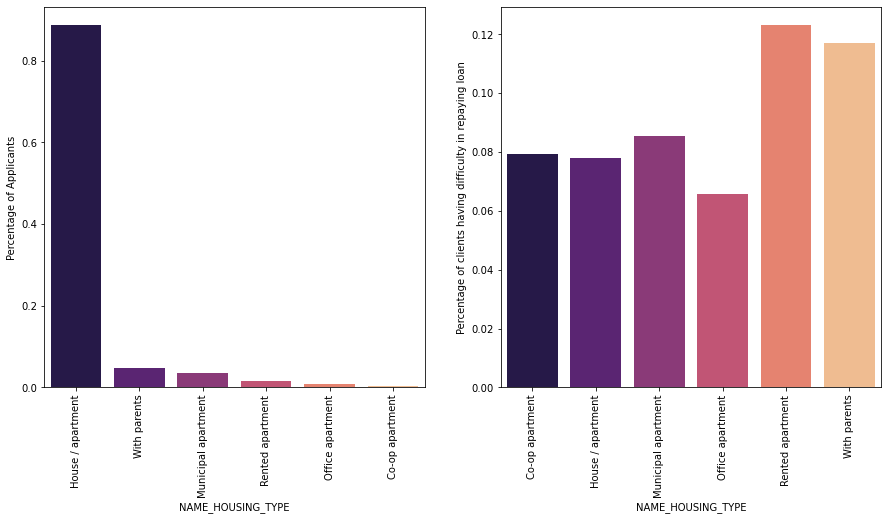

In [41]:
# BarPlots for NAME_HOUSING_TYPE
bar_plot("NAME_HOUSING_TYPE", rot = True)

### From the above plots the following inferences can be made:
1. Almost 90% of the clients live in a House/apartment, followed by living with parents, municipal apartment etc.
2. Clients who live in a rented apartment have the highest default rate of around 12%, followed by clients living with parents (almost 12%), followed by municipal apartments etc.

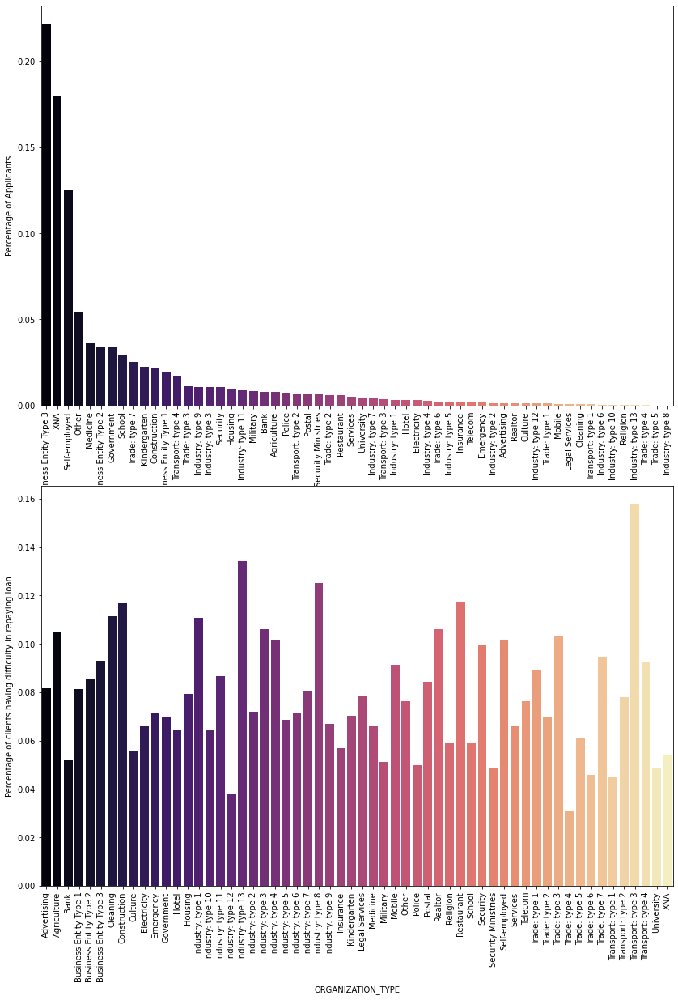

In [42]:
# BarPlots for ORGANIZATION_TYPE
bar_plot("ORGANIZATION_TYPE",hori=False, rot = True)

### From the above plots the following inferences can be made:
1. Most of the clients belong to Business Entity Type-3 (arount 20%), followed by self employed ( around 12%) etc.
2. As we can see Transport type 3 has the highest default rate of nearly 16%, followed by Industry type 13 (around 13%) and Industy type 8 (around 12%).

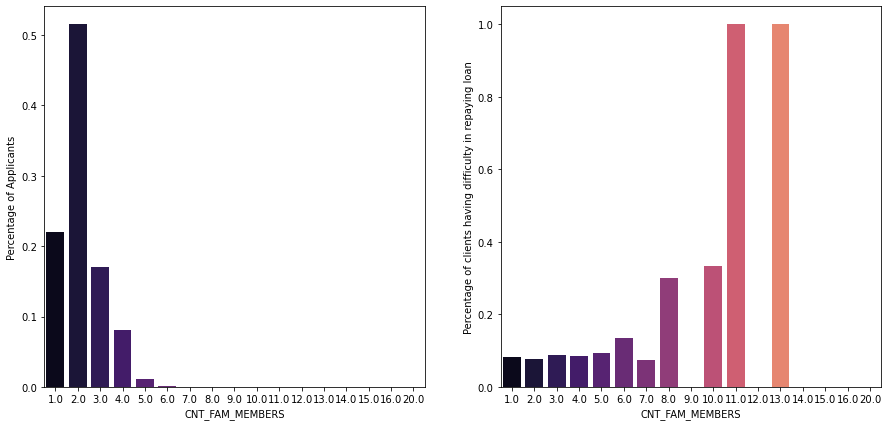

In [43]:
# BarPlots for CNT_FAM_MEMBERS
bar_plot("CNT_FAM_MEMBERS")

### From the above plots the following inferences can be made:
1. Clients with family members of 2 are the top category (approximately 50%), followed by 1 (single people), 3 ( probably families with 1 child) and 4 family members.
2. Looks like the default rate increases with the increase in family members, also clients with 11 and 13 family members have 100% default rate.

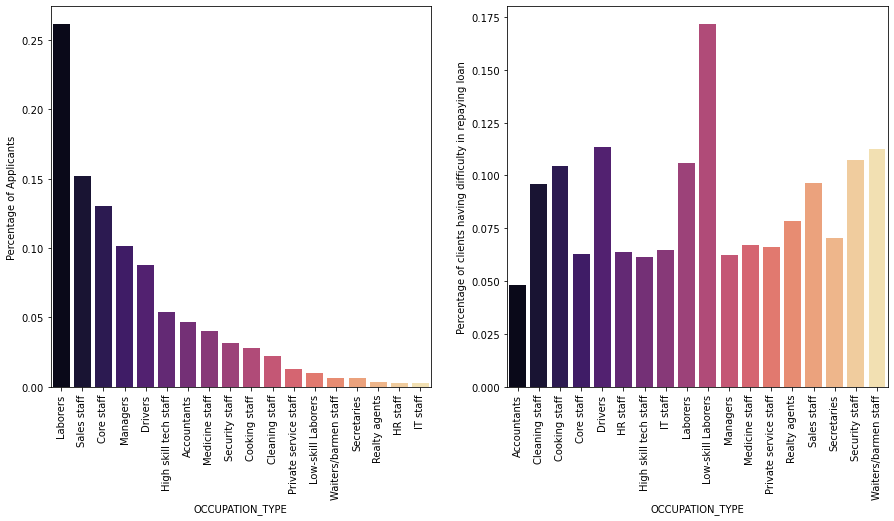

In [44]:
# BarPlots for OCCUPATION_TYPE
bar_plot("OCCUPATION_TYPE", rot = True)

- Основная часть клиентов предпочла кредиты наличными (примерно 85-90%), в то время как 10-15% выбрали возобновляемые кредиты.
- Средняя ставка по кредитам наличными составляет примерно 8,5%, в то время как по возобновляемым кредитам она составляет примерно 5,5%. Это показывает, что клиенты, выбравшие кредиты наличными, с большей вероятностью допустят дефолт.
- Клиентов-женщин значительно больше (примерно 65%), чем клиентов-мужчин (примерно 35%).
- Клиенты-мужчины более склонны к дефолту (примерно 10%) по сравнению с клиентами-женщинами (примерно 7%).
- Большинство кредитных клиентов не имеют собственного автомобиля (примерно 65-70%), в то время как примерно 30-35% из них владеют одним или несколькими автомобилями.
- Клиенты, у которых нет собственного автомобиля, с большей вероятностью допустят дефолт (примерно 8,5%), чем клиенты, у которых есть один или несколько автомобилей (примерно 7%).
- Большинство клиентов владеют недвижимостью (примерно 70%), в то время как примерно 30% из них недвижимостью не владеют.
- Удивительно, но клиенты, владеющие недвижимостью, имеют более высокие шансы не вернуть свои кредиты (примерно 5,5%) по сравнению с клиентами, не владеющими недвижимостью (примерно 2,5%).
- У большинства клиентов нет детей (примерно 70%), и около 20% заявителей имеют 1 ребенка и менее 10% клиентов имеют 2 детей.
- Похоже, что шансы не погасить кредит возрастают с увеличением количества детей у клиентов. А клиенты, у которых есть 9 или 11 детей, имеют примерно 100%-ную вероятность дефолта.
- Большинство клиентов были без сопровождения во время подачи заявки на получение кредита (~80%), около 10-15% клиентов были со своими семьями во время подачи заявки, около 5% из них сопровождались супругами.
- Примерно все эти категории имеют одинаковую процентную ставку дефолта, поэтому люди, которые сопровождают клиента при подаче заявки на получение кредита, не играют большой роли в принятии решения о том, будет ли он / она не выплачивать кредит.
- Более половины клиентов работают, около 20-25% - коммерческие партнеры, почти 20% - пенсионеры и почти 10% - государственные служащие.
- Клиенты, находящиеся в декретном отпуске, и безработные клиенты наиболее склонны к дефолту (примерно 35-40%), остальные виды дохода имеют вероятность дефолта около 10%.
- Большинство клиентов имеют законченное среднее образование (~70%), за ними следуют клиенты, получившие высшее образование (около 25%), за которыми следуют незаконченное высшее образование и неполная средняя школа.
- Клиенты, имеющие неполное среднее образование, наиболее склонны к дефолту (около 10%), за ними следуют незаконченное высшее (около 8%) и среднее образование (около 8%), а клиенты, имеющие академическую степень, наименее склонны к дефолту (почти 2%).
- Более половины клиентов состоят в браке (~60%), около 15% клиентов не состоят в браке, и около 10% клиентов вступили в гражданский брак, за которым следуют разведенные и вдовы.
- Одинокие клиенты и клиенты, вступившие в гражданский брак, с наибольшей вероятностью откажутся от услуг (почти 10%), за ними следуют разлученные и состоящие в браке клиенты (примерно 8%), а у вдов наименьший показатель неисполнения обязательств - около 6%.
- Почти 90% клиентов живут в доме/квартире, затем следуют проживание с родителями, муниципальная квартира и т.д.
- Клиенты, которые живут в съемной квартире, имеют самый высокий уровень дефолта - около 12%, за ними следуют клиенты, проживающие с родителями (почти 12%), за ними следуют муниципальные квартиры и т.д.
- Большинство клиентов относятся к типу юридического лица-3 (около 20%), за которым следуют самозанятые (примерно 12%) и т.д.
- Как мы видим, у транспорта типа 3 самый высокий процент невозвратов, почти 16%, за ним следуют промышленность типа 13 (около 13%) и промышленность типа 8 (примерно 12%).
- Клиенты с двумя членами семьи составляют высшую категорию (примерно 50%), за ними следуют 1 (одинокие люди), 3 (вероятно, семьи с 1 ребенком) и 4 члена семьи.
- Похоже, что частота дефолтов увеличивается с увеличением числа членов семьи, также клиенты с 11 и 13 членами семьи имеют 100%-ную частоту дефолтов.
- Большинство клиентов - чернорабочие (приблизительно 25%), за ними следуют сотрудники отдела продаж, основной персонал, менеджеры и т.д. ИТ-сотрудники берут наименьшее количество займов.
- Самый высокий процент неисполнения обязательств приходится на низкоквалифицированных работников, за которыми следуют водители, официанты/бармены, сотрудники службы безопасности, чернорабочие, повара, продавцы, уборщики и т.д.

### From the above plots the following inferences can be made:
1. Most of the clients are Laborers(approximatey 25%), followed by Sales staff, Core staff, Managers etc. IT staff take the least number of loans.
2. Low-skill labourers have the highest default rate, followed by Drivers, Waiters/barmen staff, Security staff, Laborers, Cooking staff, sales staff, cleaning staff etc.

## Одномерный анализ непрерывных переменных

In [26]:
# Сегментирование данных на основе целевой переменной

target_0 = data.loc[data['TARGET'] == 0]
target_1 = data.loc[data['TARGET'] == 1]

In [27]:
# Разработка функции для анализа непрерывных переменных

def distribution_plot(Attribute):

    plt.figure(figsize = [15,7])
    plt.subplot(1,2,1)
    sns.distplot(data[Attribute], bins= 50, kde= True, rug = True, hist = False)
    plt.ylabel("Frequency")
    plt.subplot(1,2,2)
    sns.distplot(target_0[Attribute], bins = 50, kde = True, rug= True, hist = False, label = 'TARGET = 0')
    sns.distplot(target_1[Attribute], bins = 50, kde = True, rug = True, hist = False, label= 'TARGET = 1')
    plt.ylabel("Frequency")
    plt.show()

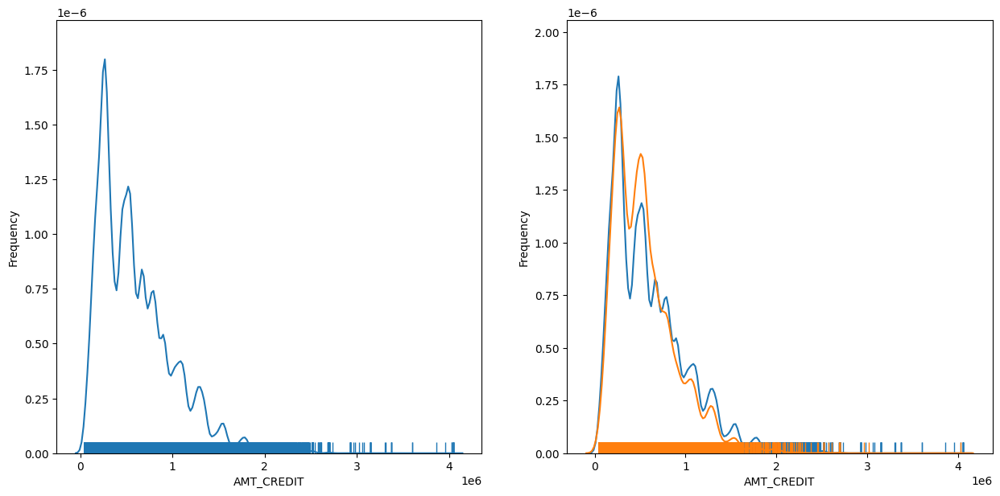

In [28]:
# Графики искажений для AMT_CREDIT
distribution_plot('AMT_CREDIT')

### Из приведенных выше графиков можно сделать следующие выводы:
1. Сумма кредита в основном составляет около 200000-1000000 как для клиента, испытывающего трудности с оплатой (ЦЕЛЬ =1), так и для всех остальных случаев (ЦЕЛЬ=0).

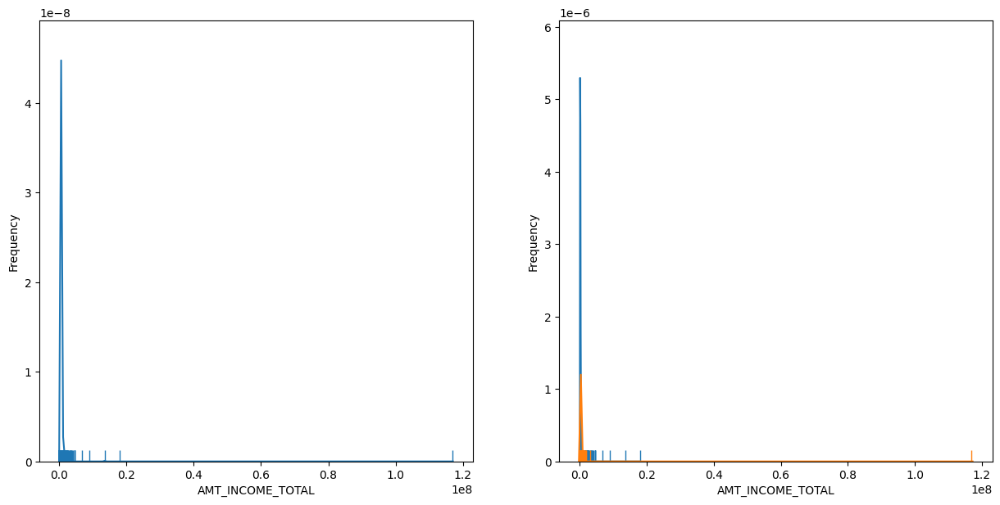

In [29]:
# DistPlots для AMT_INCOME_TOTAL 

distribution_plot('AMT_INCOME_TOTAL')

### Из приведенных выше графиков можно сделать следующие выводы:
1. Доход клиентов обоих целевых типов в основном составляет около 10000000. Мы также можем видеть некоторые выбросы.


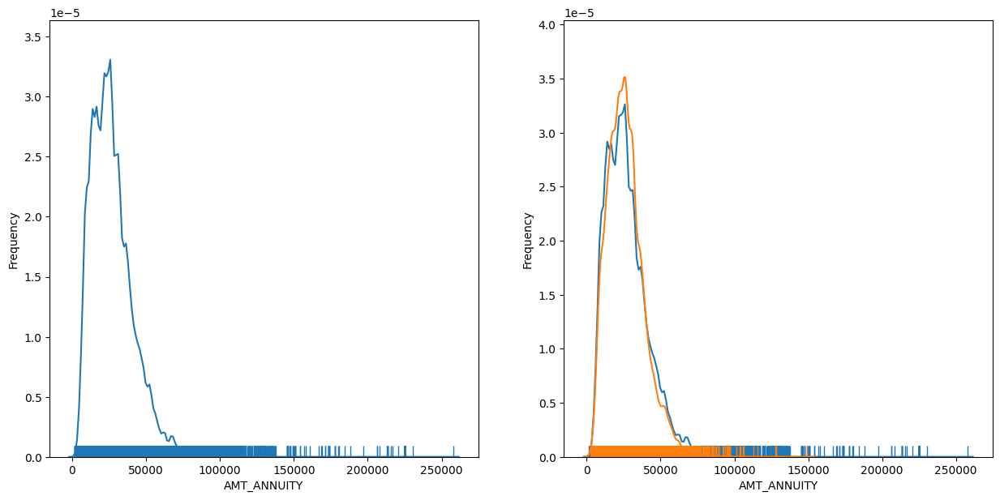

In [30]:
# DistPlots для AMT_ANNUITY

distribution_plot('AMT_ANNUITY')

### Из приведенных выше графиков можно сделать следующие выводы:
1. Сумма аннуитета, по-видимому, одинакова для обоих целевых типов, они сосредоточены на отметке около 50000.

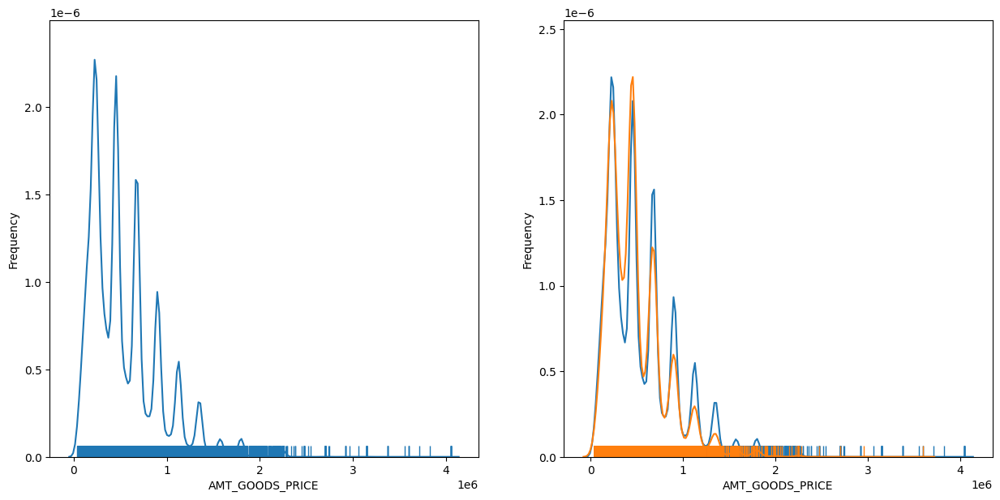

In [31]:
# DistPlots для AMT_GOODS_PRICE 

distribution_plot("AMT_GOODS_PRICE")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Товары, на которые клиенты получили кредит, в основном сосредоточены в пределах 200000-1000000

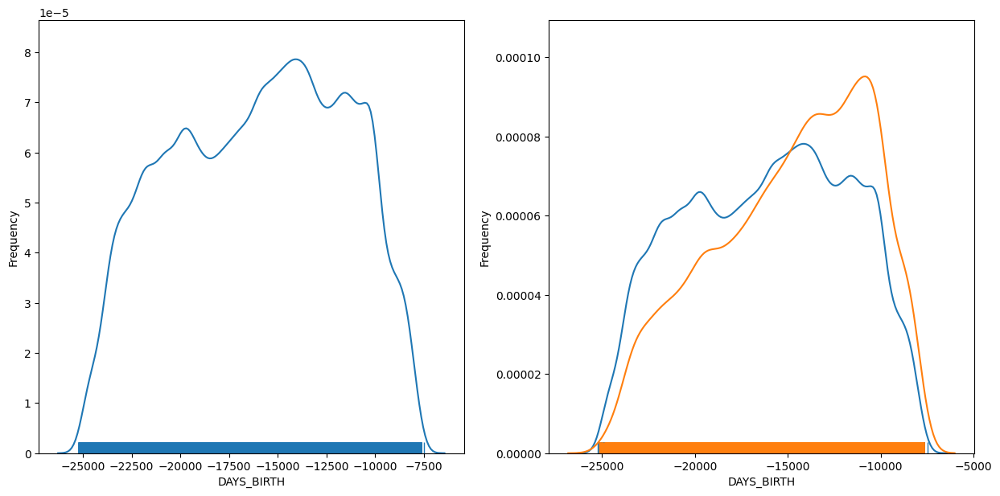

In [32]:
# DistPlots для DAYS_BIRTH 

distribution_plot("DAYS_BIRTH")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Мы преобразовали приведенный выше график из дней в годы для лучшего анализа.
2. Когда мы видим весь набор данных, включая оба целевых типа, мы видим, что у нас есть клиенты всех возрастов, причем наибольшее количество клиентов около 40 лет.
3. Когда мы сравниваем два целевых типа, мы видим, что клиенты, испытывающие трудности с оплатой, относительно моложе, и большинству из них около 27 лет. Поэтому у молодого населения самый высокий уровень дефолтов.

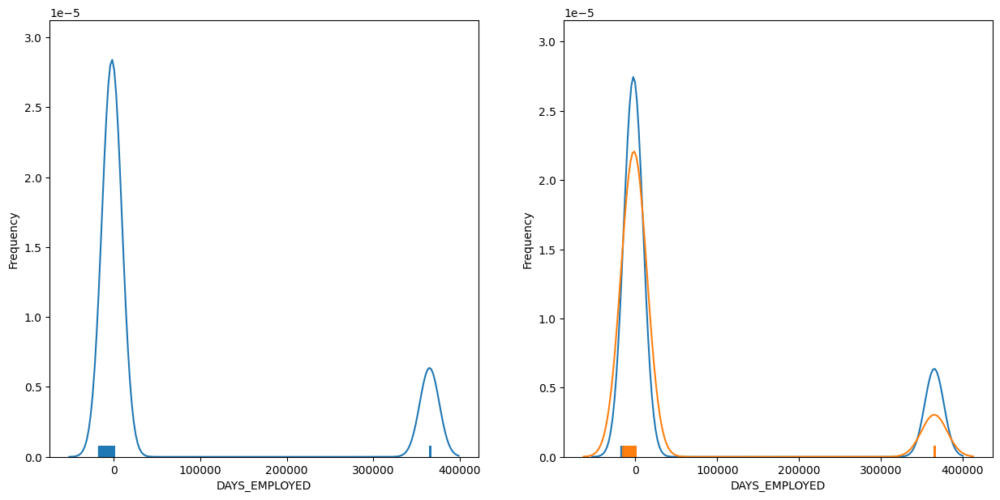

In [33]:
# DistPlots для DAYS_EMPLOYED 

distribution_plot("DAYS_EMPLOYED")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Эти данные кажутся ненадежными из-за большого числа людей, которые работают более 100 лет, и отрицательные значения могут свидетельствовать о том, что эти клиенты являются безработными.

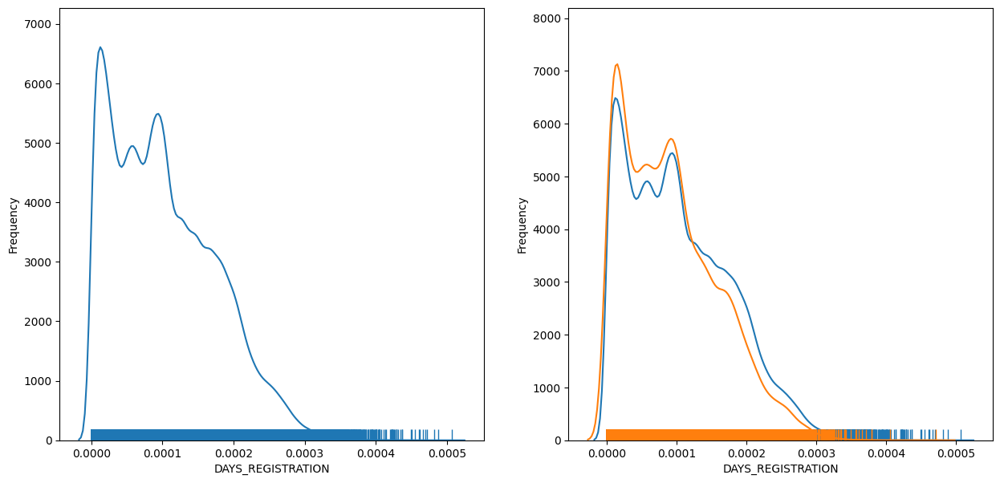

In [55]:
# DistPlots для DAYS_REGISTRATION 

distribution_plot('DAYS_REGISTRATION')

### Из приведенных выше графиков можно сделать следующие выводы:
1. Приведенные выше данные были преобразованы из дней в годы для лучшего анализа.
2. Похоже, что большинство клиентов изменили свою регистрацию на ранних стадиях.
3. Распределение аналогично для обоих целевых типов.

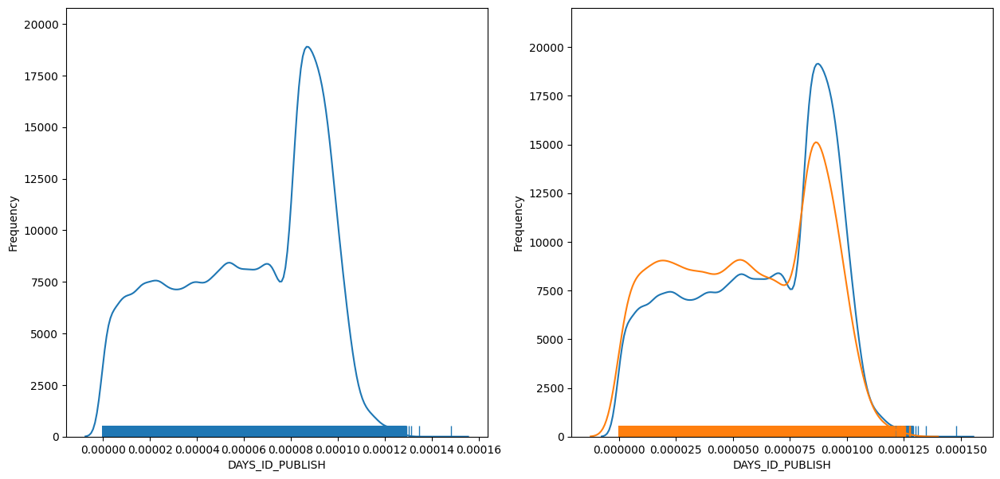

In [56]:
# DistPlots для DAYS_ID_PUBLISH 

distribution_plot("DAYS_ID_PUBLISH")

   ## ДВУМЕРНЫЙ АНАЛИЗ

In [57]:
# Определение нового фрейма данных для числового анализа
data_T1 = data[data["TARGET"] == 1]
data_T0 = data[data['TARGET'] == 0]
data_numeric_corr_T0 = data_T0[["AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE", "REGION_POPULATION_RELATIVE", "DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION", "DAYS_ID_PUBLISH"]].corr()
data_numeric_corr_T1 = data_T1[["AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE", "REGION_POPULATION_RELATIVE", "DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION", "DAYS_ID_PUBLISH"]].corr()

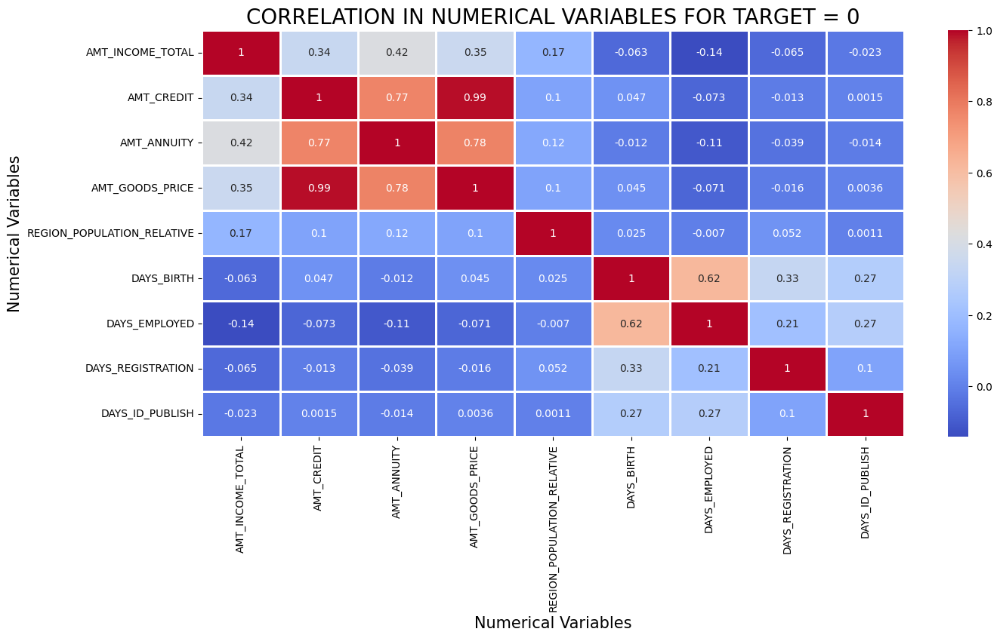

In [58]:
# Тепловая карта для визуализации корреляции между числовыми переменными при TARGET = 0
plt.figure(figsize = [15,7])
sns.heatmap(data_numeric_corr_T0, annot= True, cmap= "coolwarm", linewidths=2)
plt.xlabel("Numerical Variables", fontdict={"fontsize": 15})
plt.ylabel("Numerical Variables", fontdict={"fontsize": 15})
plt.title("CORRELATION IN NUMERICAL VARIABLES FOR TARGET = 0",fontdict={"fontsize": 20} )
plt.show()

### Из приведенной выше тепловой карты (для ЦЕЛИ=0) можно сделать следующие выводы:
1. Сумма кредита и сумма цены товара имеют самую высокую корреляцию - 0,99, что довольно очевидно, поскольку клиент выбирает кредит, равный цене его товара.
2. Сумма аннуитета и сумма цены товара имеют корреляцию 0,78. Поскольку размер аннуитета определяется ценой товара (суммой кредита).
3. Сумма кредита и сумма аннуитета имеют корреляцию 0,77. Поскольку сумма аннуитета зависит от суммы кредита.
4. Сумма дохода и сумма аннуитета имеют корреляцию 0,42. Размер аннуитета может быть определен исходя из дохода клиента.
5. Корреляция между суммой дохода и суммой кредита довольно хорошая (0,34), а также между суммой аннуитета и суммой дохода (0,42), что может быть причиной того, что эти клиенты в состоянии погасить свои кредиты.

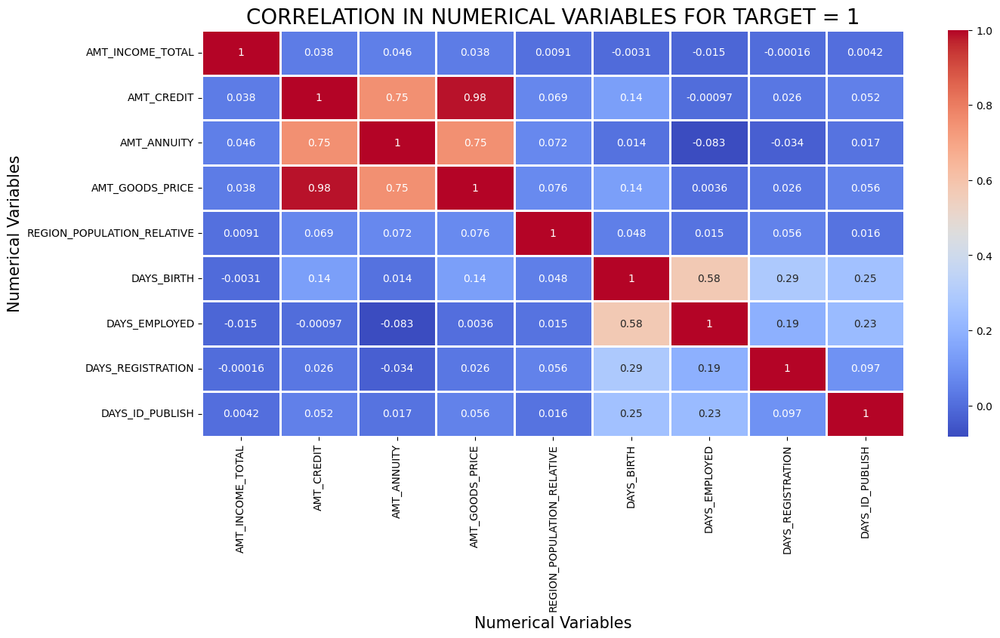

In [59]:
# Тепловая карта для визуализации корреляции между числовыми переменными для TARGET = 1
plt.figure(figsize = [15,7])
sns.heatmap(data_numeric_corr_T1, annot= True, cmap= "coolwarm", linewidths=2)
plt.xlabel("Numerical Variables", fontdict={"fontsize": 15})
plt.ylabel("Numerical Variables", fontdict={"fontsize": 15})
plt.title("CORRELATION IN NUMERICAL VARIABLES FOR TARGET = 1",fontdict={"fontsize": 20} )
plt.show()

### Из приведенной выше тепловой карты (для ЦЕЛИ=1) можно сделать следующие выводы:
1. Сумма кредита и сумма цены товара имеют самую высокую корреляцию - 0,98, что довольно очевидно, поскольку клиент выбирает кредит, равный цене его товара.
2. Сумма аннуитета и сумма цены товара имеют корреляцию 0,75. Поскольку размер аннуитета определяется ценой товара (суммой кредита).
3. Сумма кредита и сумма аннуитета имеют корреляцию 0,75. Поскольку сумма аннуитета зависит от суммы кредита.
4. Корреляция между суммой дохода и суммой кредита очень мала (0,038), а также между суммой аннуитета и суммой дохода (0,046), что может быть причиной трудностей с погашением кредита.

## ЧИСЛЕННЫЙ И КАТЕГОРИАЛЬНЫЙ АНАЛИЗ

In [60]:
# Определение функции для численно-категориального анализа переменных
def NUMCAT_ANALYSIS(CATVAR, NUMVAR, rot = False):
    
    plt.figure(figsize=[15,7])
    if rot:
        plt.xticks(rotation = 90)
    sns.boxplot(data = data, x=CATVAR, y= NUMVAR, hue = "TARGET")

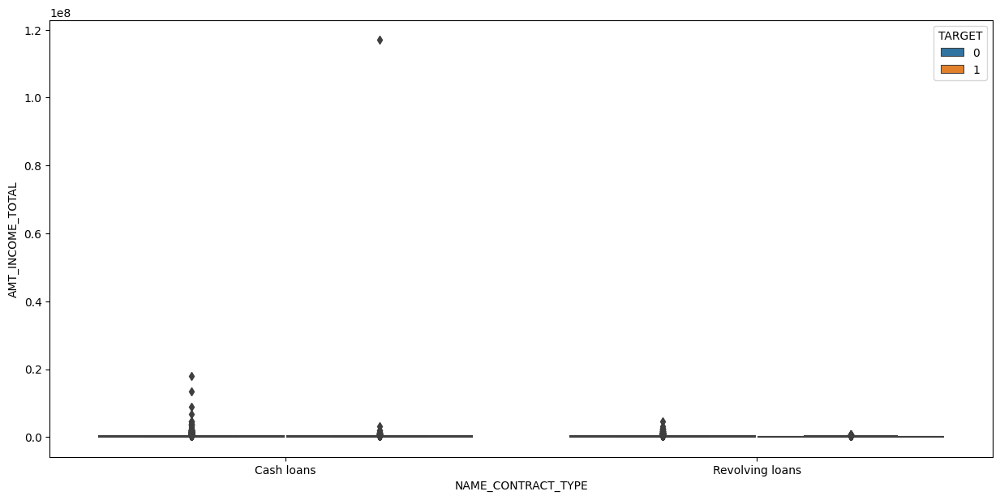

In [61]:
# BoxPlots для NAME_CONTRACT_TYPE и AMT_INCOME_TOTAL
NUMCAT_ANALYSIS("NAME_CONTRACT_TYPE","AMT_INCOME_TOTAL" )

### Из приведенных выше графиков можно сделать следующие выводы:
1. Из-за наличия экстремального выброса в данных они не могут быть визуализированы должным образом.
2. Все графики имеют выбросы.

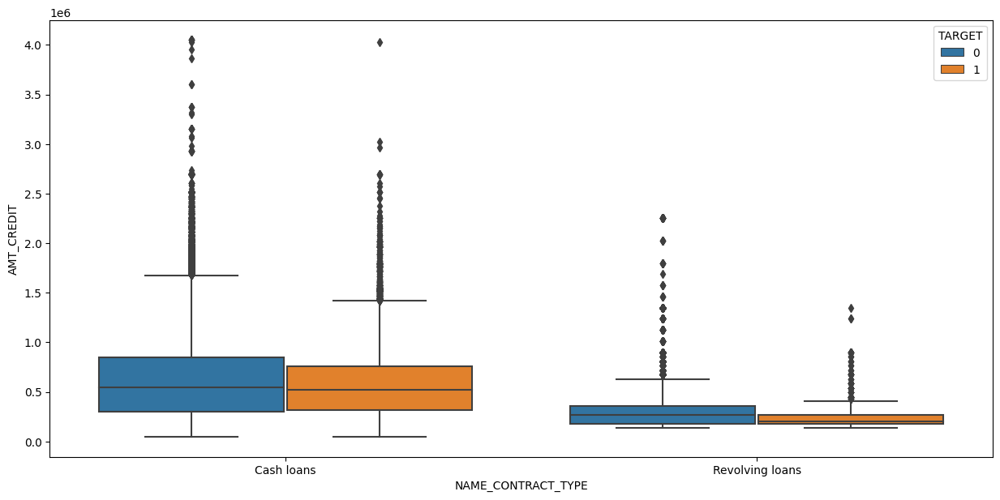

In [62]:
# BoxPlots для NAME_CONTRACT_TYPE и AMT_CREDIT
NUMCAT_ANALYSIS("NAME_CONTRACT_TYPE","AMT_CREDIT" )

### Из приведенных выше графиков можно сделать следующие выводы:
1. Совершенно очевидно, что суммы кредитов наличными выше по сравнению с возобновляемыми кредитами
2. Сумма кредита сосредоточена в нижней части IQR для ЦЕЛИ=1, что говорит о том, что большинство клиентов, испытывающих трудности с погашением кредитов, имеют меньшую сумму кредита.

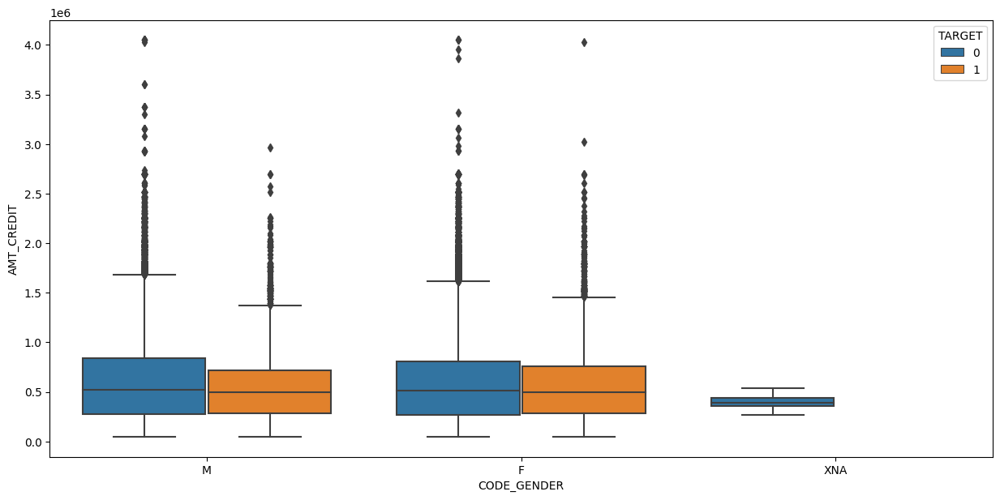

In [63]:
# BoxPlots для CODE_GENDER и AMT_CREDIT
NUMCAT_ANALYSIS("CODE_GENDER", "AMT_CREDIT")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Медианы всех графиков одинаковы, а также IQR также довольно схожи для обоих полов.
2. Это показывает, что пол не является решающим фактором для суммы кредита.

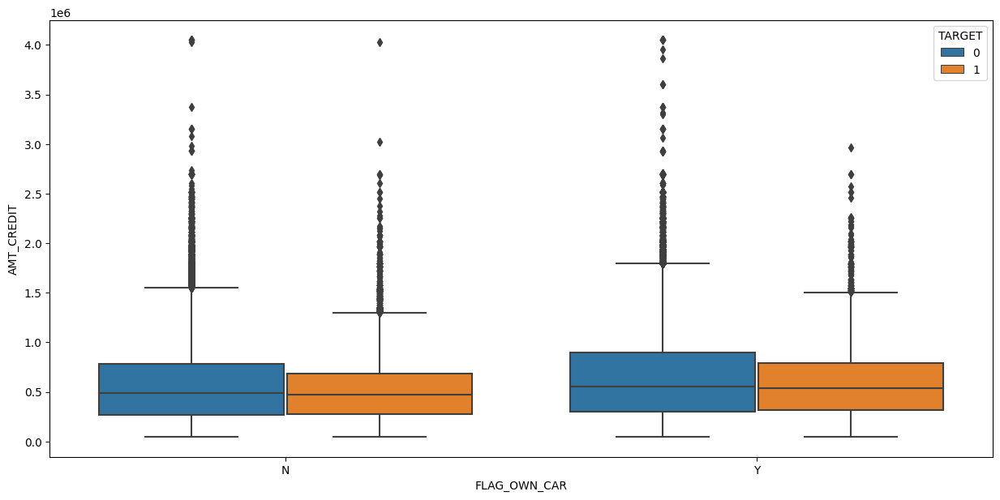

In [64]:
# BoxPlots для FLAG_OWN_CAR и AMT_CREDIT
NUMCAT_ANALYSIS("FLAG_OWN_CAR", "AMT_CREDIT")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Медианы прямоугольных графиков очень похожи, так же как и IQRs
2. Это говорит о том, что владение автомобилем не оказывает большого влияния на сумму кредита.

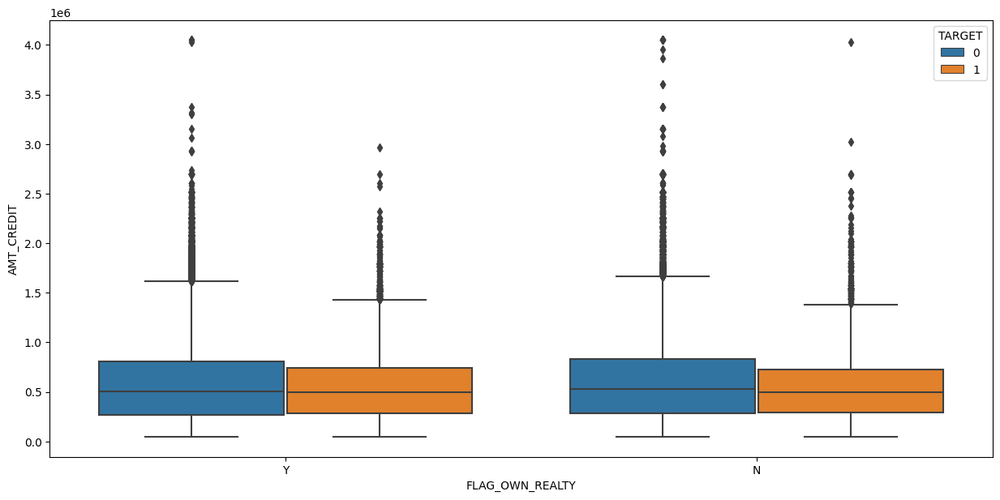

In [65]:
# BoxPlots для FLAG_OWN_REALTY и AMT_CREDIT
NUMCAT_ANALYSIS("FLAG_OWN_REALTY", "AMT_CREDIT")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Медианы прямоугольных графиков очень похожи, так же как и IQRs.
2. Это говорит о том, что владение жильем не оказывает большого влияния на сумму кредита.

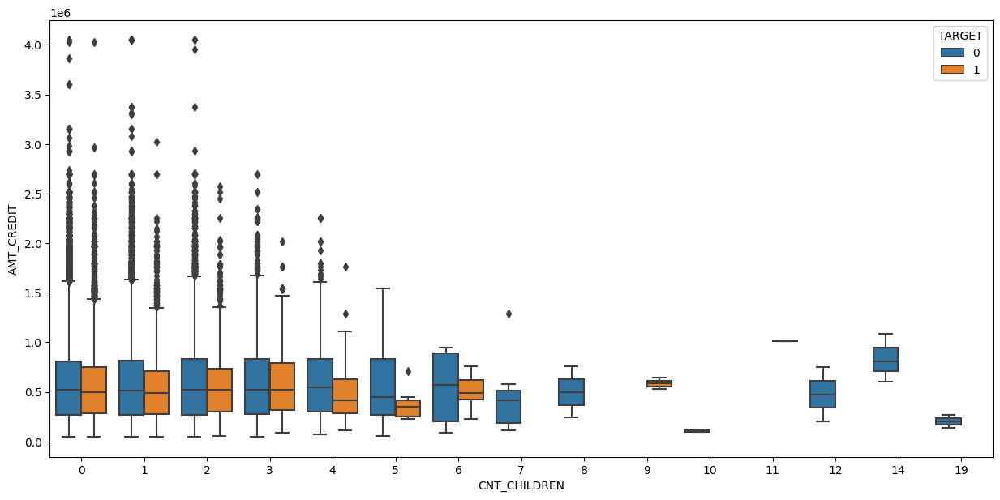

In [66]:
# BoxPlots для CNT_CHILDREN и AMT_CREDIT
NUMCAT_ANALYSIS("CNT_CHILDREN", "AMT_CREDIT")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Поскольку число детей превышает 6, мы наблюдаем нехватку данных из-за отсутствия графиков.

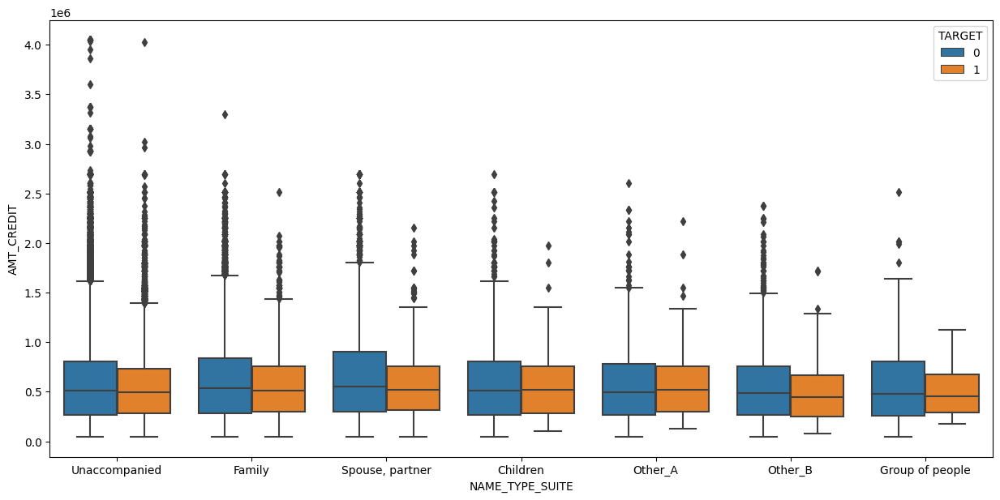

In [67]:
# BoxPlots для NAME_TYPE_SUITE и AMT_CREDIT
NUMCAT_ANALYSIS("NAME_TYPE_SUITE","AMT_CREDIT" )

### Из приведенных выше графиков можно сделать следующие выводы:
1. Блок-схемы довольно схожи для всех категорий 'NAME_TYPE_SUITE'

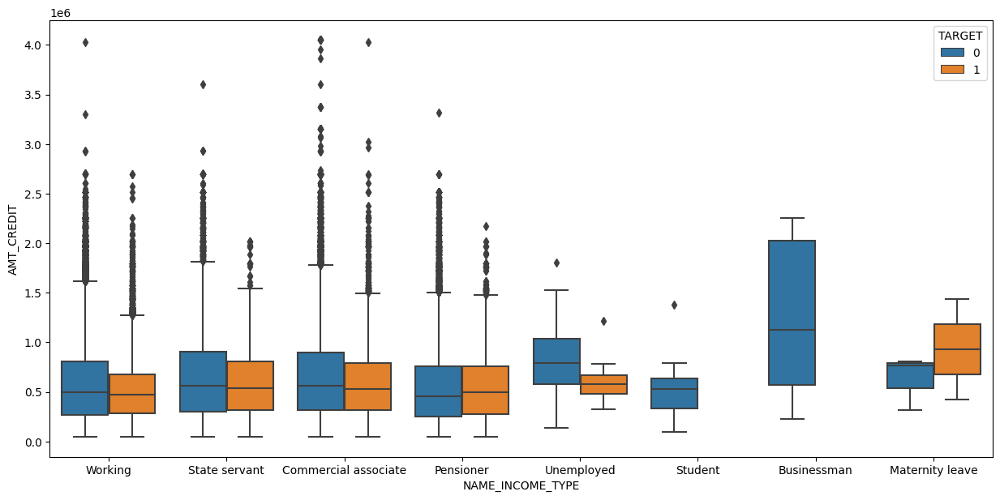

In [68]:
# BoxPlots для NAME_INCOME_TYPE и AMT_CREDIT
NUMCAT_ANALYSIS("NAME_INCOME_TYPE", "AMT_CREDIT")

### Из приведенных выше графиков можно сделать следующие выводы:
1. У клиентов, которые являются бизнесменами и студентами, нет прямоугольного графика для TARGET=1, который показывает, что неплательщиков нет
2. У бизнесменов высокий IQR, что говорит о том, что сумма кредита имеет огромный диапазон.

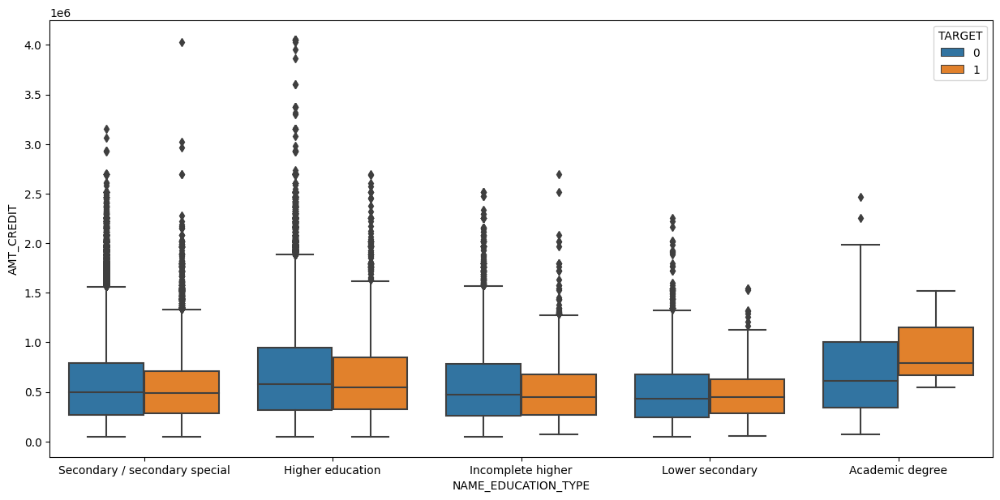

In [69]:
# BoxPlots для NAME_EDUCATION_TYPE и AMT_CREDIT
NUMCAT_ANALYSIS("NAME_EDUCATION_TYPE", "AMT_CREDIT")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Что касается клиентов с академической степенью, то те, кто испытывает трудности с погашением кредита, имеют более высокие суммы кредита, что может быть причиной дефолта.

## АНАЛИЗ ПЕРЕМЕННЫХ ОТ КАТЕГОРИИ К КАТЕГОРИИ
#### ЭТО ДАСТ СВЯЗЬ МЕЖДУ РАЗЛИЧНЫМИ КАТЕГОРИАЛЬНЫМИ ПЕРЕМЕННЫМИ

In [70]:
# Создание списка важных категориальных переменных для нашего анализа
CAT_VAR_LIST = ["NAME_CONTRACT_TYPE", "CODE_GENDER", "FLAG_OWN_CAR","FLAG_OWN_REALTY", "CNT_CHILDREN","NAME_TYPE_SUITE", "NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE", "OCCUPATION_TYPE", "ORGANIZATION_TYPE" ]

In [71]:
# Определение функции для категориально-категориального анализа переменных
def CAT_CAT_ANALYSIS(CAT1, CAT2, rot = False):
    res = pd.pivot_table(data = data, index = CAT1, columns= CAT2, values = "TARGET")
    plt.figure(figsize = [35, 10])
    sns.heatmap(data = res, annot = True, cmap = "coolwarm",linewidths= 0.3)
    if rot:
        plt.xticks(rotation = 90)
    plt.show()

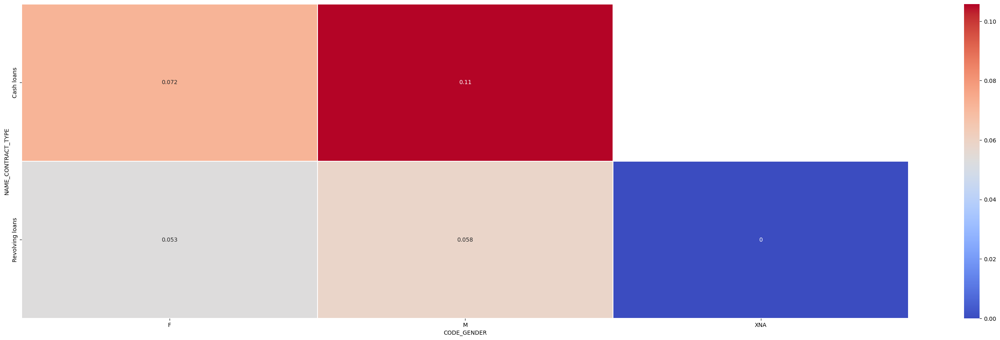

In [72]:
# Тепловая карта для поиска связи между NAME_CONTRACT_TYPE и CODE_GENDER
CAT_CAT_ANALYSIS("NAME_CONTRACT_TYPE", "CODE_GENDER")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты мужского пола, выбравшие кредиты наличными, с наибольшей вероятностью допустят дефолт.

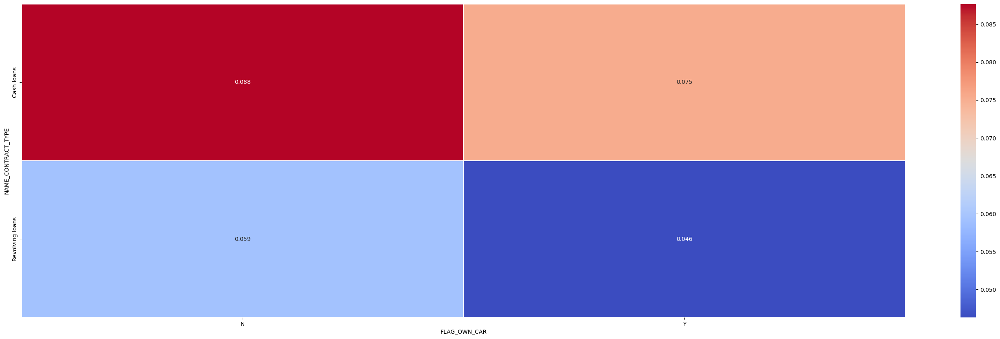

In [73]:
# Тепловая карта, чтобы найти связь между NAME_CONTRACT_TYPE и FLAG_OWN_CAR
CAT_CAT_ANALYSIS("NAME_CONTRACT_TYPE","FLAG_OWN_CAR")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, выбравшие кредиты наличными, с большей вероятностью допустят дефолт независимо от того, есть у них автомобиль или нет.
2. В целом клиенты, у которых нет собственного автомобиля, более склонны к дефолту.

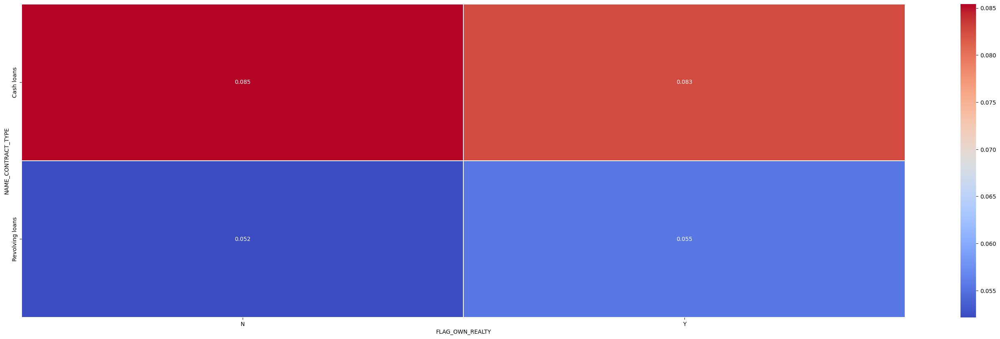

In [74]:
# Тепловая карта, чтобы найти связь между NAME_CONTRACT_TYPE и FLAG_OWN_REALTY
CAT_CAT_ANALYSIS("NAME_CONTRACT_TYPE","FLAG_OWN_REALTY")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, которые выбрали кредиты наличными и не владеют недвижимостью, скорее всего, объявят дефолт.
2. Владение недвижимостью, по-видимому, не оказывает большого влияния, поскольку ставка дефолта почти одинакова как для наличных, так и для возобновляемых кредитов.

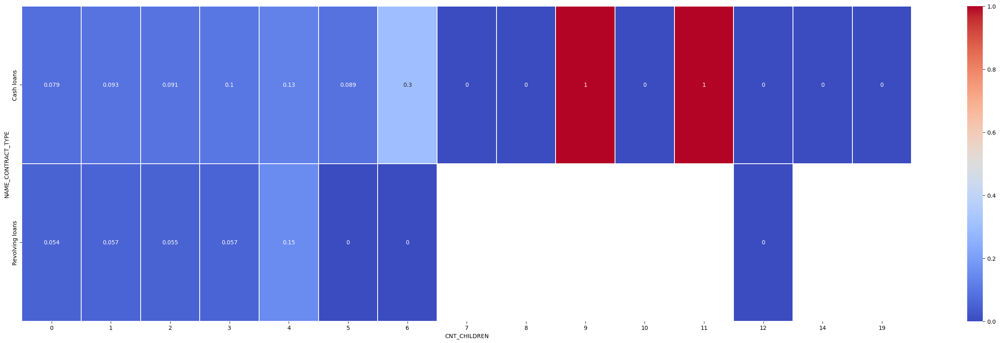

In [75]:
# Тепловая карта для поиска связи между NAME_CONTRACT_TYPE и CNT_CHILDREN
CAT_CAT_ANALYSIS("NAME_CONTRACT_TYPE", "CNT_CHILDREN")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Коэффициент дефолта увеличивается с увеличением числа детей.
2. Клиенты с 9 или 11 детьми наиболее склонны к дефолту.

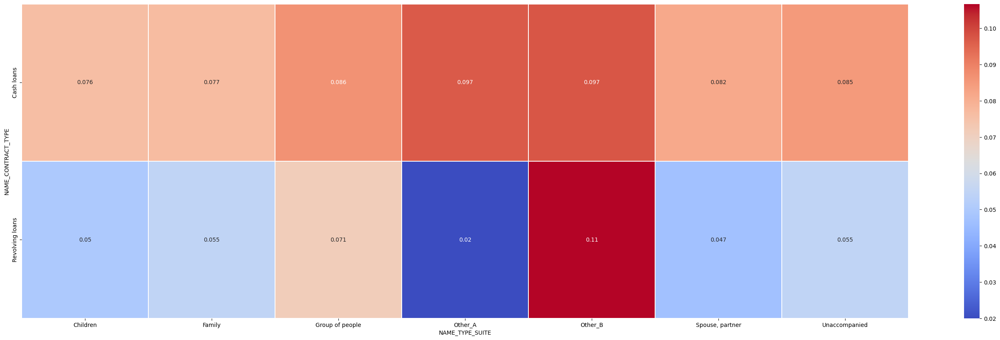

In [76]:
# Тепловая карта для поиска связи между NAME_CONTRACT_TYPE и NAME_TYPE_SUITE
CAT_CAT_ANALYSIS("NAME_CONTRACT_TYPE","NAME_TYPE_SUITE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, которые выбрали возобновляемые кредиты и принадлежат к "Other_B", с наибольшей вероятностью допустят дефолт.
2. Клиенты, которые выбрали кредиты наличными и принадлежат к группам "Other_A" и "Other_B", также с большей вероятностью допустят дефолт.

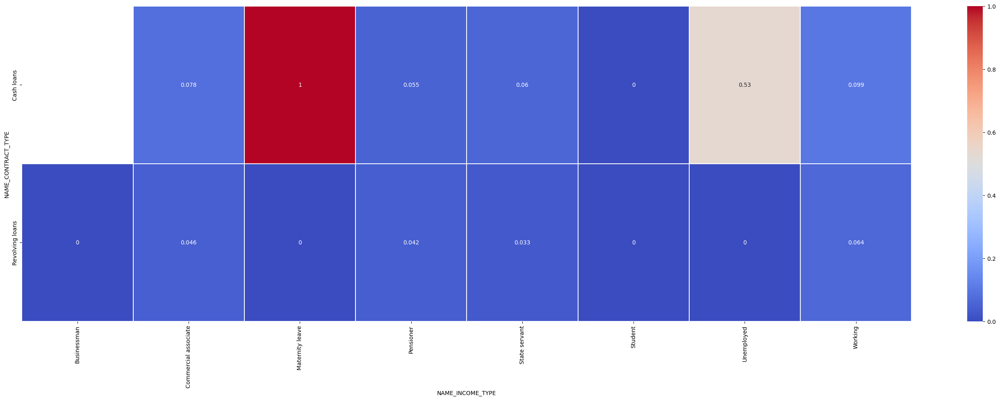

In [77]:
# Тепловая карта для поиска связи между NAME_CONTRACT_TYPE и NAME_INCOME_TYPE
CAT_CAT_ANALYSIS("NAME_CONTRACT_TYPE", "NAME_INCOME_TYPE", True)

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Совершенно очевидно, что женщины, находящиеся в декретном отпуске, с наибольшей вероятностью объявят дефолт.
2. Безработные клиенты, которые выбрали кредиты наличными, с большой вероятностью объявят дефолт.

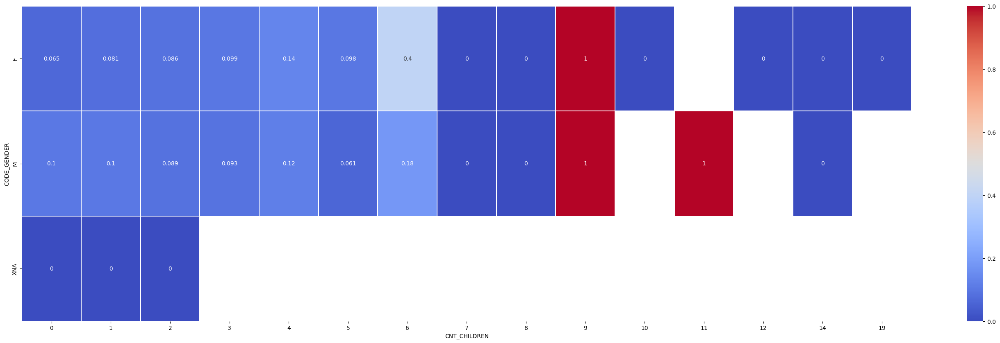

In [78]:
CAT_CAT_ANALYSIS("CODE_GENDER", "CNT_CHILDREN")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Процент неисполнения обязательств увеличивается с увеличением количества детей, которые есть у клиента, независимо от пола.
2. Клиенты с 9 или 11 детьми наиболее склонны к дефолту, также клиенты-женщины с 6 детьми имеют шанс на дефолт.

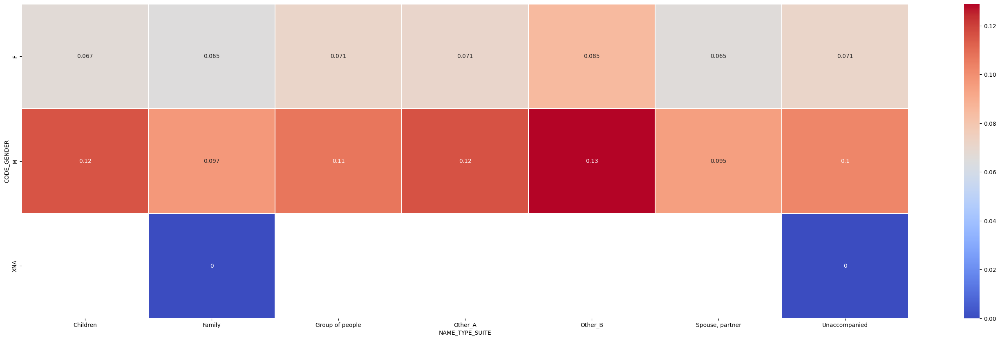

In [79]:
# Тепловая карта, чтобы найти связь между CODE_GENDER и NAME_TYPE_SUITE
CAT_CAT_ANALYSIS("CODE_GENDER", "NAME_TYPE_SUITE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты мужского пола с большей вероятностью будут использовать значение по умолчанию независимо от 'NAME_TYPE_SUITE'


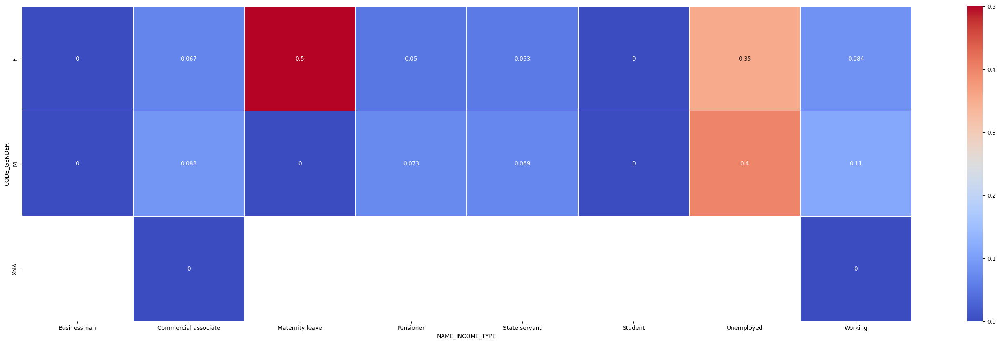

In [80]:
# Тепловая карта, чтобы найти связь между CODE_GENDER и NAME_INCOME_TYPE
CAT_CAT_ANALYSIS("CODE_GENDER", "NAME_INCOME_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Женщины, находящиеся в отпуске по беременности и родам, чаще всего не выполняют свои обязательства.
2. Кроме того, безработные клиенты имеют высокий уровень неисполнения обязательств независимо от пола.

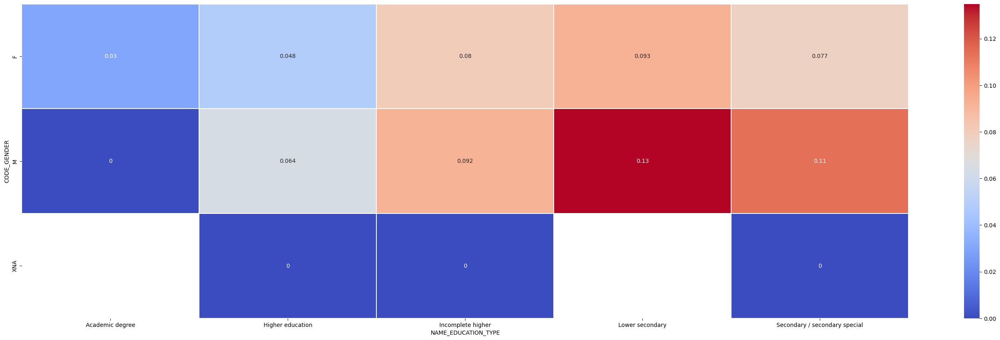

In [81]:
# Тепловая карта, чтобы найти связь между CODE_GENDER и NAME_EDUCATION_TYPE
CAT_CAT_ANALYSIS("CODE_GENDER", "NAME_EDUCATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты мужского пола более склонны к дефолту, независимо от типа образования.

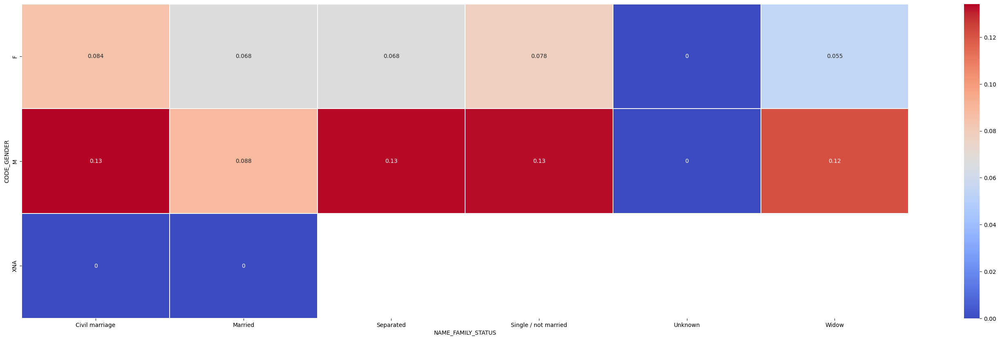

In [82]:
# Тепловая карта, чтобы найти связь между CODE_GENDER и NAME_FAMILY_STATUS
CAT_CAT_ANALYSIS("CODE_GENDER", "NAME_FAMILY_STATUS")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты мужского пола более склонны к дефолту, независимо от семейного положения.

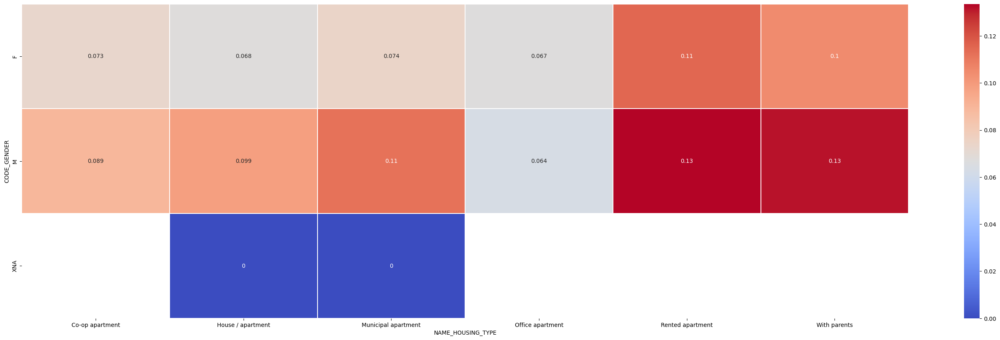

In [83]:
# Тепловая карта, чтобы найти связь между CODE_GENDER и NAME_HOUSING_TYPE
CAT_CAT_ANALYSIS("CODE_GENDER", "NAME_HOUSING_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты мужского пола более склонны к дефолту, независимо от типа жилья.

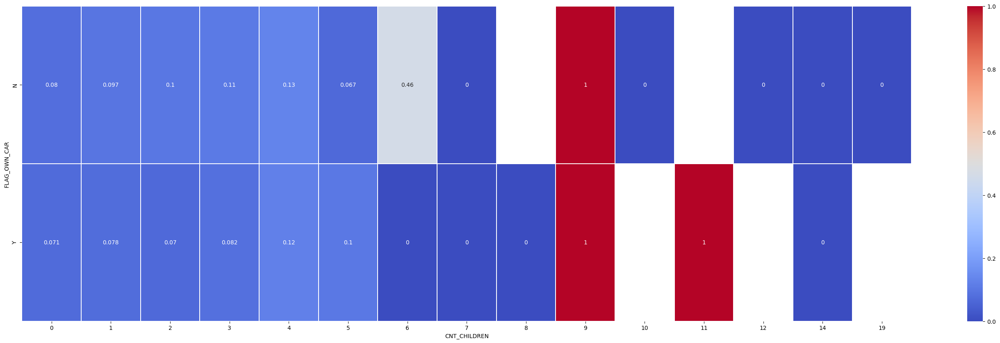

In [84]:
# Тепловая карта для поиска связи между FLAG_OWN_CAR и CNT_CHILDREN
CAT_CAT_ANALYSIS("FLAG_OWN_CAR","CNT_CHILDREN")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Ставка по умолчанию увеличивается с увеличением количества детей у клиента, независимо от того, есть у него автомобиль или нет.
2. Как мы видели ранее, клиенты с 9 или 11 детьми наиболее склонны к дефолту.
3. Также клиенты, у которых нет собственного автомобиля и у которых есть 6 детей, имеют высокий процент неисполнения обязательств.

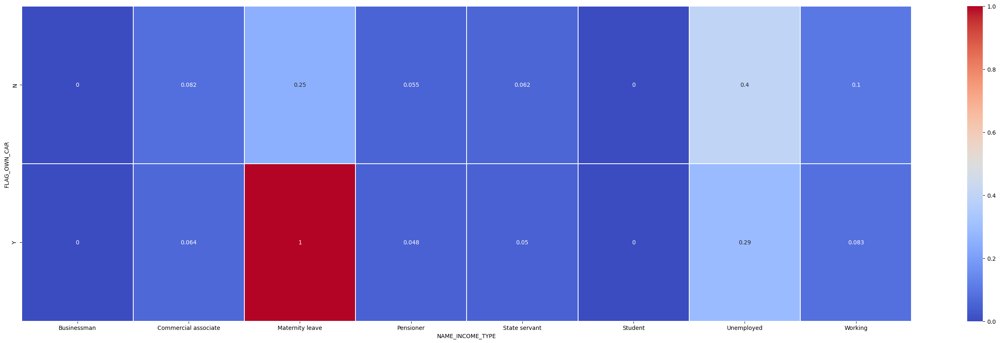

In [85]:
# Тепловая карта, чтобы найти связь между FLAG_OWN_CAR и NAME_INCOME_TYPE
CAT_CAT_ANALYSIS("FLAG_OWN_CAR","NAME_INCOME_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Женщины, находящиеся в декретном отпуске и владеющие автомобилем, чаще всего объявляют дефолт.
2. Безработные клиенты, у которых нет собственного автомобиля, имеют высокий процент невозвратов.

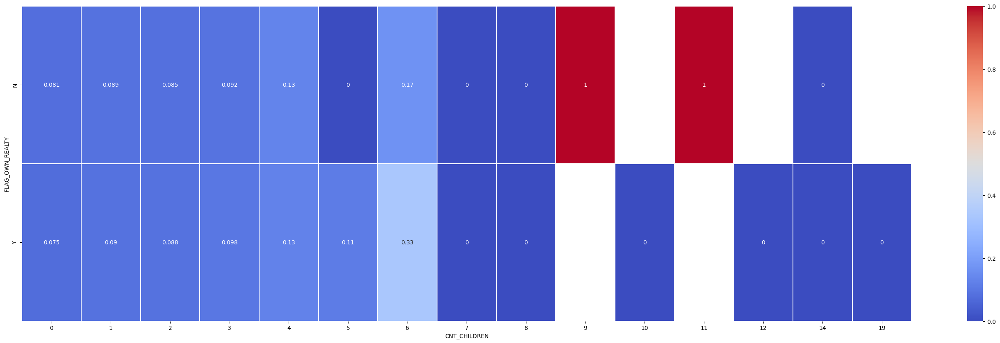

In [86]:
# Тепловая карта для поиска связи между FLAG_OWN_REALTY и CNT_CHILDREN
CAT_CAT_ANALYSIS("FLAG_OWN_REALTY","CNT_CHILDREN")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Процент неисполнения обязательств увеличивается с увеличением числа детей, которые есть у клиента, независимо от того, владеет он недвижимостью или нет.
2. Как мы видели ранее, клиенты с 9 или 11 детьми, скорее всего, объявят дефолт, и они также не владеют недвижимостью.

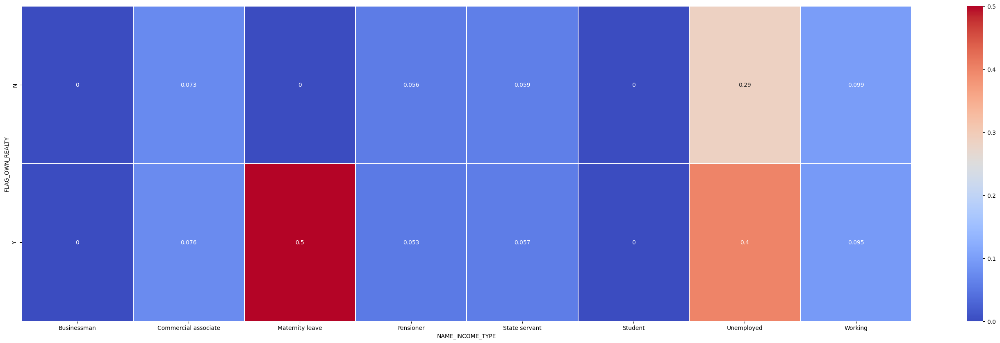

In [87]:
# Тепловая карта, чтобы найти связь между FLAG_OWN_REALTY и NAME_INCOME_TYPE
CAT_CAT_ANALYSIS("FLAG_OWN_REALTY","NAME_INCOME_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Женщины, находящиеся в декретном отпуске и владеющие недвижимостью, наиболее склонны к дефолту.
2. Безработные клиенты, которые на самом деле не владеют недвижимостью, также имеют высокий уровень дефолтов. 
3. Безработные клиенты, владеющие недвижимостью, также, скорее всего, объявят дефолт.

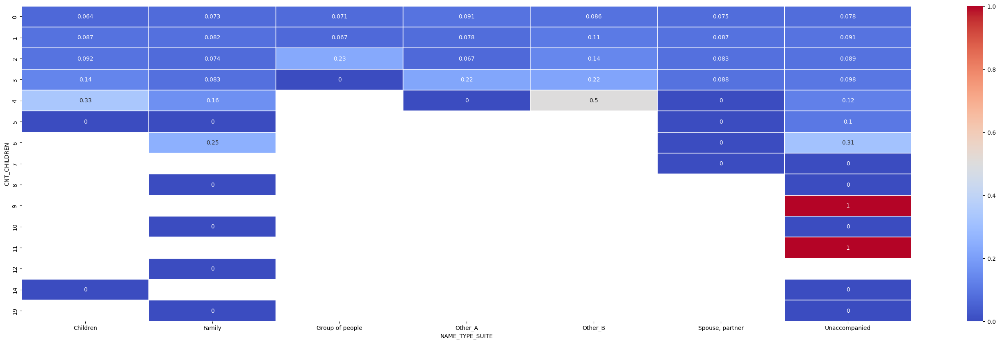

In [88]:
# Тепловая карта для поиска связи между CNT_CHILDREN и NAME_TYPE_SUITE
CAT_CAT_ANALYSIS("CNT_CHILDREN","NAME_TYPE_SUITE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, которые были без сопровождения и имеют 9 или 11 детей, скорее всего, не выполнят обязательства.
2. Клиенты, у которых есть 4 ребенка и которые относятся к категории "Other_B", имеют высокий процент неисполнения обязательств.

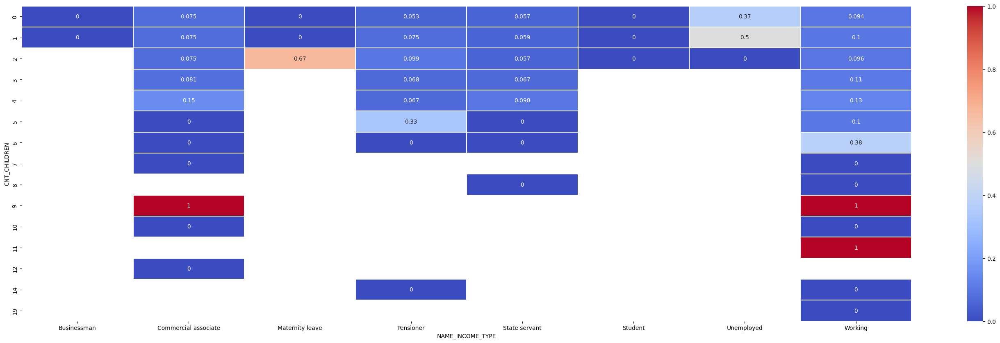

In [89]:
# Тепловая карта для поиска связи между CNT_CHILDREN и NAME_INCOME_TYPE
CAT_CAT_ANALYSIS("CNT_CHILDREN","NAME_INCOME_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Как мы уже видели ранее, клиенты, у которых 9 или 11 детей, чаще всего допускают дефолт.
2. Клиенты, имеющие 6 детей и работающие, имеют высокий уровень неисполнения обязательств, клиенты, которые являются пенсионерами и имеют 5 детей, также имеют высокий уровень неисполнения обязательств.

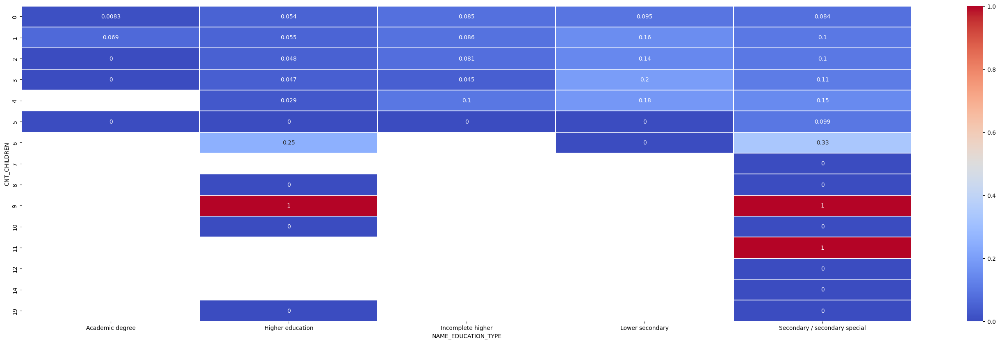

In [90]:
# Тепловая карта для поиска связи между CNT_CHILDREN и NAME_EDUCATION_TYPE
CAT_CAT_ANALYSIS("CNT_CHILDREN","NAME_EDUCATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, у которых есть 9 или 11 детей, с наибольшей вероятностью допустят дефолт.
2. Клиенты, у которых есть 6 детей со средним образованием, имеют высокий процент дефолтов, клиенты с 6 детьми и законченным высшим образованием также подвержены дефолту.

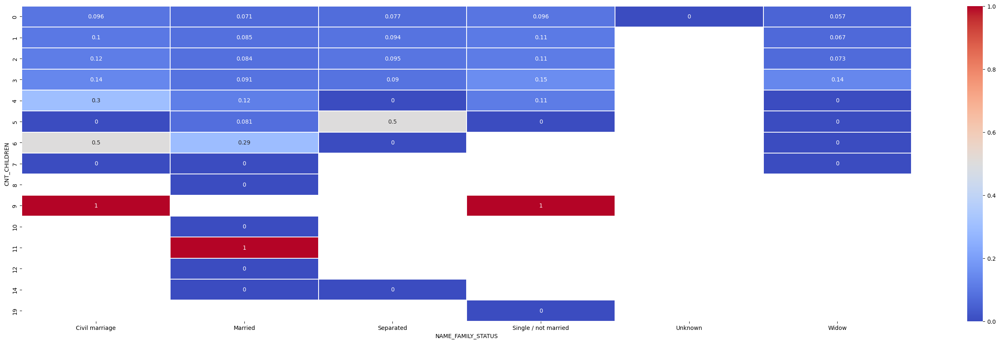

In [91]:
# Тепловая карта для поиска связи между CNT_CHILDREN и NAME_FAMILY_STATUS
CAT_CAT_ANALYSIS("CNT_CHILDREN","NAME_FAMILY_STATUS")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, у которых есть 9 или 11 детей, с наибольшей вероятностью допустят дефолт.
2. Клиенты, которые живут раздельно и имеют 5 детей, имеют высокий процент неисполнения обязательств.
3. Клиенты, у которых есть 6 детей и которые вступили в гражданский брак, также имеют высокий процент неисполнения обязательств.

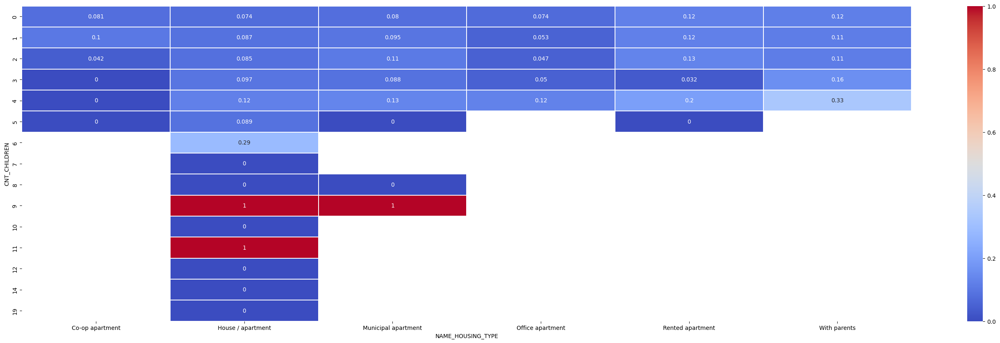

In [92]:
# Тепловая карта для поиска связи между CNT_CHILDREN и NAME_HOUSING_TYPE
CAT_CAT_ANALYSIS("CNT_CHILDREN","NAME_HOUSING_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Как мы уже видели ранее, клиенты, у которых 9 или 11 детей, чаще всего допускают дефолт.

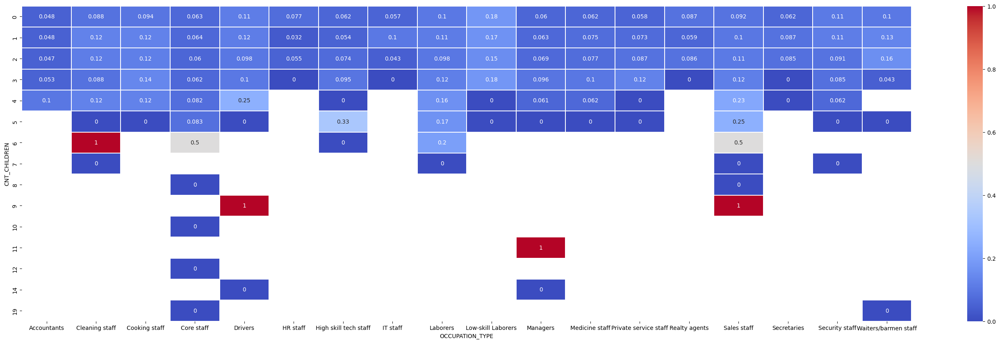

In [93]:
# Тепловая карта для поиска связи между CNT_CHILDREN и OCCUPATION_TYPE
CAT_CAT_ANALYSIS("CNT_CHILDREN","OCCUPATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, у которых было 9 или 11 детей, с наибольшей вероятностью допустят дефолт.
2. Клиенты, у которых 6 детей и которые работают уборщицами, также, скорее всего, не выполнят свои обязательства.

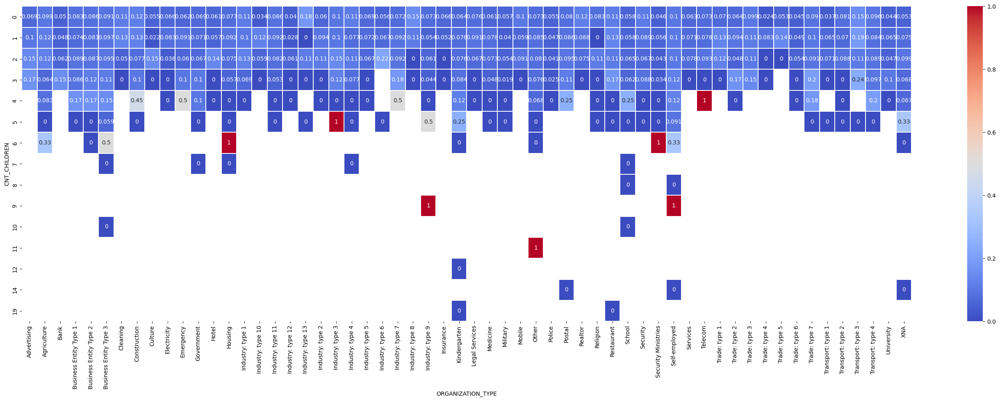

In [94]:
# Тепловая карта для поиска связи между CNT_CHILDREN и ORGANIZATION_TYPE
CAT_CAT_ANALYSIS("CNT_CHILDREN","ORGANIZATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, у которых есть 9 или 11 детей, с наибольшей вероятностью допустят дефолт.
2. Мы также наблюдаем очень высокий уровень неисполнения обязательств клиентами, имеющими 6 детей, которые работают в министерствах жилищного строительства и безопасности, а также клиентами, у которых 5 детей, и в промышленности третьего типа, и, наконец, клиентами, у которых 4 ребенка, и в сфере телекоммуникаций.
3. Поскольку в каждом конкретном случае мы видим, что клиенты с 9 или 11 детьми, скорее всего, допустят дефолт, это может быть связано с недостаточностью имеющихся данных.

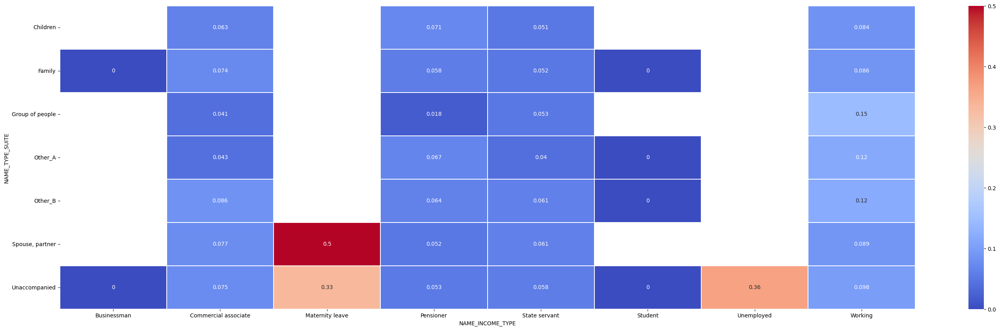

In [95]:
# Тепловая карта, чтобы найти связь между NAME_TYPE_SUITE и NAME_INCOME_TYPE
CAT_CAT_ANALYSIS("NAME_TYPE_SUITE", "NAME_INCOME_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, находящиеся в декретном отпуске и с партнером, имеют высокий процент неисполнения обязательств.
2. Безработные и несопровождаемые клиенты также имеют высокий процент неисполнения обязательств.

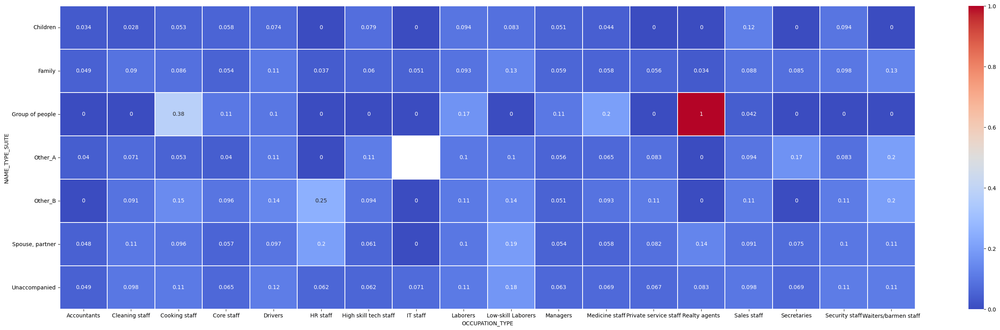

In [96]:
# Тепловая карта, чтобы найти связь между NAME_TYPE_SUITE и OCCUPATION_TYPE
CAT_CAT_ANALYSIS("NAME_TYPE_SUITE", "OCCUPATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, которые являются агентами по недвижимости и которых сопровождала группа людей при подаче заявки на получение кредита, с наибольшей вероятностью допустят дефолт.
2. Сотрудники кулинарии, сопровождаемые группой людей при подаче заявки на получение кредита, имеют высокий процент неисполнения обязательств.

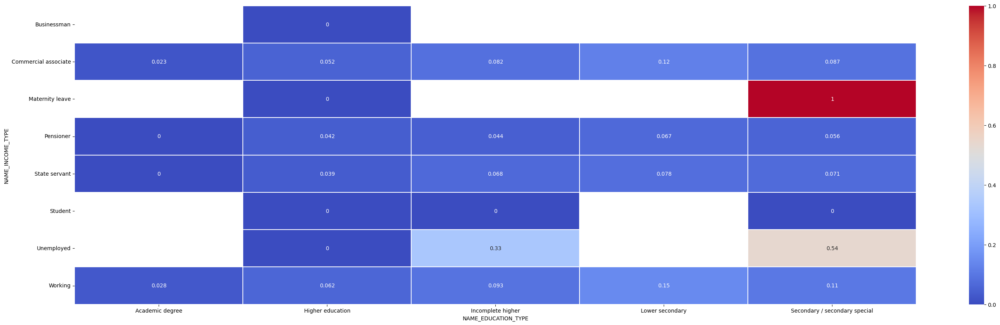

In [97]:
# Тепловая карта для поиска связи между NAME_INCOME_TYPE и NAME_EDUCATION_TYPE
CAT_CAT_ANALYSIS("NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, находящиеся в декретном отпуске и имеющие законченное среднее образование, с наибольшей вероятностью допустят дефолт.
2. Безработные клиенты, получившие среднее образование, имеют высокий уровень неплатежей.

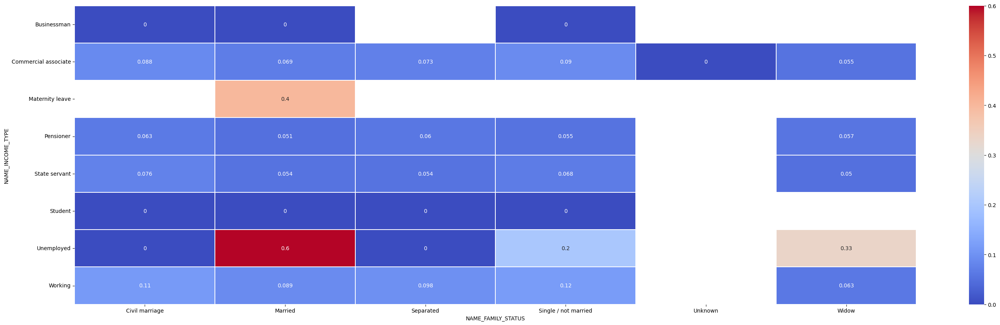

In [98]:
# Тепловая карта, чтобы найти связь между NAME_INCOME_TYPE и NAME_FAMILY_STATUS
CAT_CAT_ANALYSIS("NAME_INCOME_TYPE","NAME_FAMILY_STATUS")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, которые не имеют работы и состоят в браке, с наибольшей вероятностью объявят дефолт.
2. Клиенты, находящиеся в декретном отпуске и состоящие в браке, имеют высокий уровень неисполнения обязательств.
3. Безработные клиенты, которые также являются вдовами, также имеют высокий уровень дефолтов.

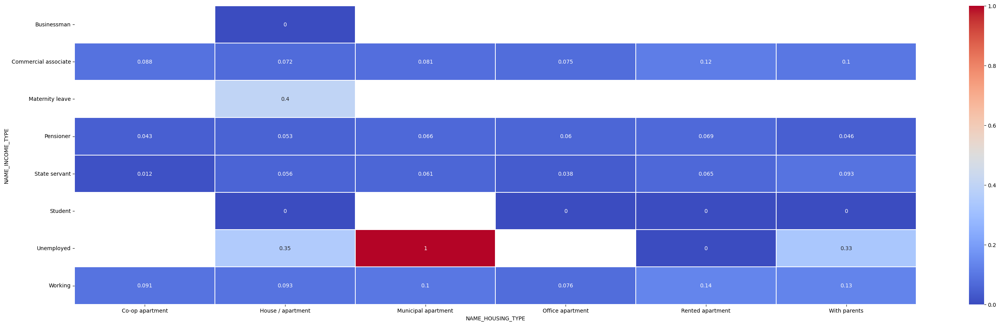

In [99]:
# Тепловая карта для поиска связи между NAME_INCOME_TYPE и NAME_HOUSING_TYPE
CAT_CAT_ANALYSIS("NAME_INCOME_TYPE","NAME_HOUSING_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Безработные клиенты, как правило, имеют высокий уровень неплатежей, особенно те, кто живет в муниципальной квартире.
2. Клиенты, находящиеся в декретном отпуске и проживающие в доме /квартире, также имеют высокий уровень неисполнения обязательств.

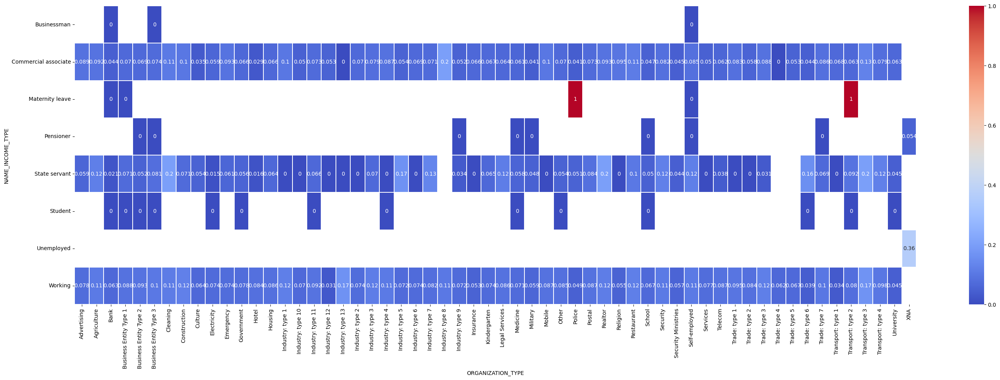

In [100]:
# Тепловая карта для поиска связи между NAME_INCOME_TYPE и ORGANIZATION_TYPE
CAT_CAT_ANALYSIS("NAME_INCOME_TYPE","ORGANIZATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, находящиеся в декретном отпуске, скорее всего, не выполнят обязательства независимо от типа организации.

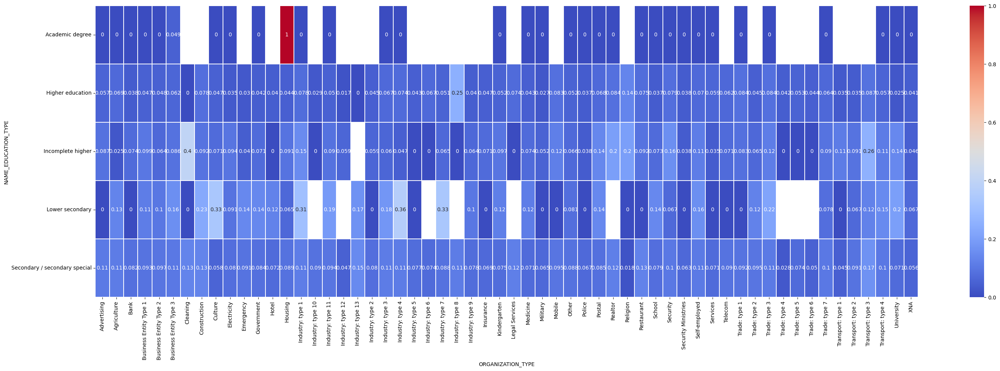

In [101]:
# Тепловая карта для поиска связи между NAME_EDUCATION_TYPE и ORGANIZATION_TYPE
CAT_CAT_ANALYSIS("NAME_EDUCATION_TYPE", "ORGANIZATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, имеющие академическую степень и относящиеся к категории жилья, имеют более высокие шансы на дефолт.
2. Клиенты с неполным средним образованием имеют относительно высокий уровень дефолтов.

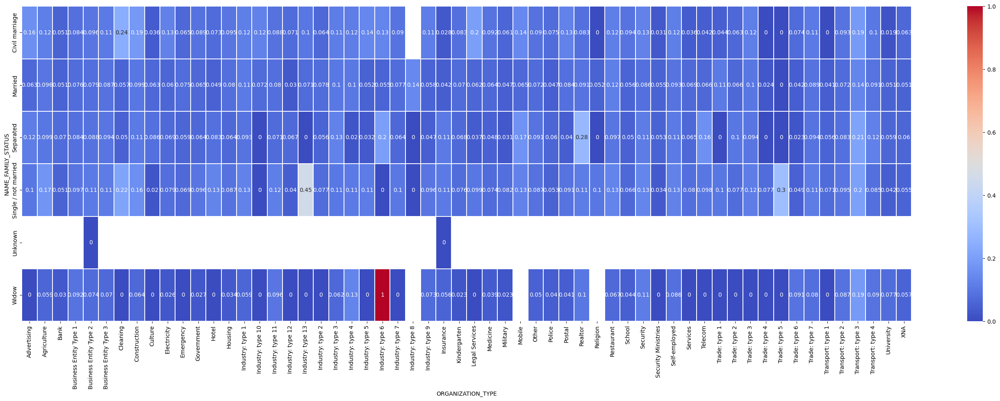

In [102]:
# Тепловая карта для поиска связи между NAME_FAMILY_STATUS и ORGANIZATION_TYPE
CAT_CAT_ANALYSIS("NAME_FAMILY_STATUS","ORGANIZATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, которые являются вдовами и относятся к отраслевому типу 6, имеют более высокие шансы на дефолт.

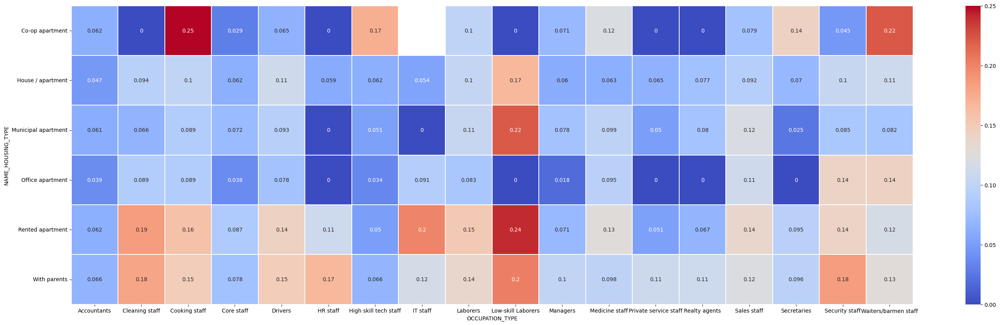

In [103]:
# Тепловая карта, чтобы найти связь между NAME_HOUSING_TYPE и OCCUPATION_TYPE
CAT_CAT_ANALYSIS("NAME_HOUSING_TYPE","OCCUPATION_TYPE")

### Из приведенной выше тепловой карты можно сделать следующие выводы:
1. Клиенты, которые являются низкоквалифицированными работниками, в целом более склонны к дефолту.
2. Персонал, готовящий еду в кооперативных квартирах, скорее всего, не выполнит своих обязанностей.

In [51]:
# Импорт набора данных 'previous_application'.
Previous_data = pd.read_csv("previous_application.csv")

In [106]:
Previous_data.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [107]:
Previous_data_null = (Previous_data.isnull().sum()/len(Previous_data))*100
Previous_data_null

SK_ID_PREV                      0.000000
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
AMT_ANNUITY                    22.286665
AMT_APPLICATION                 0.000000
AMT_CREDIT                      0.000060
AMT_DOWN_PAYMENT               53.636480
AMT_GOODS_PRICE                23.081773
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
RATE_DOWN_PAYMENT              53.636480
RATE_INTEREST_PRIMARY          99.643698
RATE_INTEREST_PRIVILEGED       99.643698
NAME_CASH_LOAN_PURPOSE          0.000000
NAME_CONTRACT_STATUS            0.000000
DAYS_DECISION                   0.000000
NAME_PAYMENT_TYPE               0.000000
CODE_REJECT_REASON              0.000000
NAME_TYPE_SUITE                49.119754
NAME_CLIENT_TYPE                0.000000
NAME_GOODS_CATEGORY             0.000000
NAME_PORTFOLIO                  0.000000
NAME_PRODUCT_TYP

In [108]:
# Удаление столбцов с большим количеством нулевых значений.
Previous_data.drop(Previous_data_null[Previous_data_null.values>=40].index, axis = 1, inplace = True)

## Объединение обоих файлов данных(application_data и previous_application)

In [52]:
# Объединение данных
merged_data = data.merge(Previous_data, on= 'SK_ID_CURR', how = 'inner')

In [110]:
merged_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,DAYS_LAST_PHONE_CHANGE,AMT_INCOME_TOTAL_Range,AMT_CREDIT_Range,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,0.000195,-637,0.000075,0.000044,Laborers,1.0,2,2,0,0,0,0,0,0,Business Entity Type 3,-1134.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,XAP,Approved,-606,XNA,XAP,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,0.000345,-1188,0.000024,0.000006,Core staff,2.0,1,1,0,0,0,0,0,0,School,-828.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,XNA,Approved,-746,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,0.000345,-1188,0.000024,0.000006,Core staff,2.0,1,1,0,0,0,0,0,0,School,-828.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17,Y,1,XAP,Approved,-828,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,0.000345,-1188,0.000024,0.000006,Core staff,2.0,1,1,0,0,0,0,0,0,School,-828.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,SATURDAY,15,Y,1,XAP,Approved,-2341,Cash through the bank,XAP,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,0.000392,-225,0.000088,0.000052,Laborers,1.0,2,2,0,0,0,0,0,0,Government,-815.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,FRIDAY,5,Y,1,XAP,Approved,-815,Cash through the bank,XAP,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest


In [111]:
merged_data.shape

(1413701, 60)

## ИЗУЧЕНИЕ ВЫБРОСОВ И РАСПРЕДЕЛЕНИЯ ДАННЫХ В ПРЕДЫДУЩИХ ДАННЫХ

In [112]:
# Определение функции для коробочных диаграмм для выявления выбросов
def box_plot_p(VAR):
    plt.figure(figsize = [10,5])
    g = sns.catplot(x="TARGET",
    y=VAR,
    kind="box",
    data=merged_data)
    plt.show()

<Figure size 1000x500 with 0 Axes>

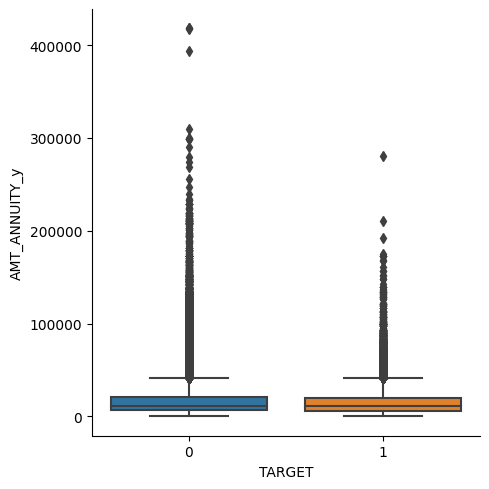

In [113]:
# BoxPlot для AMT_ANNUITY_y
box_plot_p("AMT_ANNUITY_y")

- Оба целевых типа имеют отклонения в отношении суммы аннуитета.
- Оба целевых типа, по-видимому, имеют одинаковые суммы аннуитета.

<Figure size 1000x500 with 0 Axes>

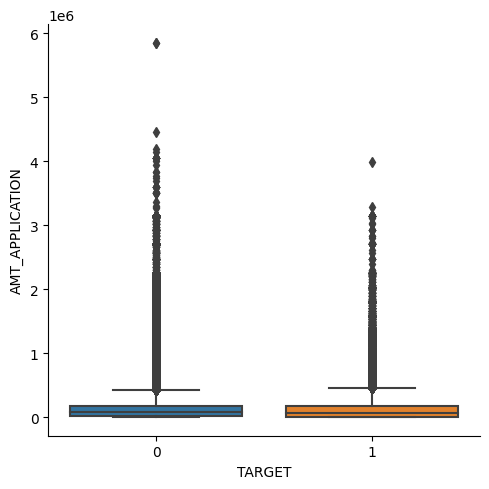

In [114]:
# BoxPlot для AMT_APPLICATION
box_plot_p("AMT_APPLICATION")

- Оба целевых типа имеют отклонения в отношении запрашиваемой суммы кредита.
- Клиенты обоих целевых типов, похоже, запросили одинаковую сумму кредита.

<Figure size 1000x500 with 0 Axes>

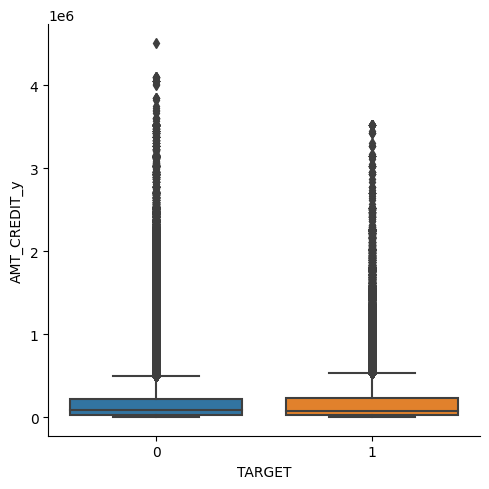

In [115]:
# BoxPlot для AMT_CREDIT_y
box_plot_p("AMT_CREDIT_y")

- Оба целевых типа имеют отклонения в отношении предлагаемой суммы кредита.
- Похоже, что обоим целевым типам предлагаются одинаковые суммы кредитов.

<Figure size 1000x500 with 0 Axes>

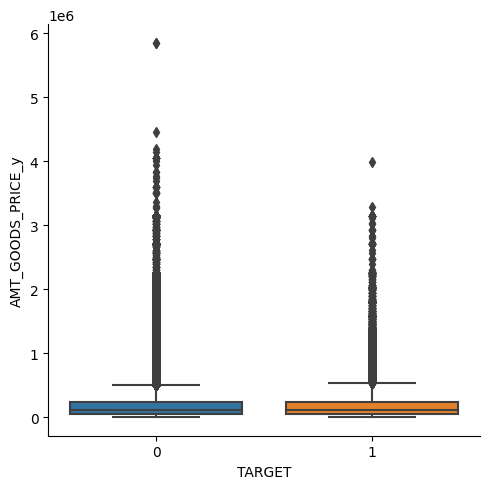

In [116]:
# BoxPlot для AMT_GOODS_PRICE_y
box_plot_p("AMT_GOODS_PRICE_y")

- Оба целевых типа имеют отклонения в отношении предлагаемой суммы кредита.
- Похоже, что обоим целевым типам предлагаются одинаковые суммы кредитов.

### Из приведенных выше графиков можно сделать следующие выводы:
1. Около 20% клиентов имеют средние, за которыми следуют высокие и низко_нормальные процентные ставки.
2. Клиенты с высокой процентной ставкой наиболее склонны к дефолту (почти 10%), за ними следуют клиенты со средней и низкой нормой.

In [119]:
merged_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,DAYS_LAST_PHONE_CHANGE,AMT_INCOME_TOTAL_Range,AMT_CREDIT_Range,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,0.000195,-637,0.000075,0.000044,Laborers,1.0,2,2,0,0,0,0,0,0,Business Entity Type 3,-1134.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",1038818,Consumer loans,9251.775,179055.0,179055.0,179055.0,SATURDAY,9,Y,1,XAP,Approved,-606,XNA,XAP,New,Vehicles,POS,XNA,Stone,500,Auto technology,24.0,low_normal,POS other with interest
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,0.000345,-1188,0.000024,0.000006,Core staff,2.0,1,1,0,0,0,0,0,0,School,-828.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",1810518,Cash loans,98356.995,900000.0,1035882.0,900000.0,FRIDAY,12,Y,1,XNA,Approved,-746,XNA,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,low_normal,Cash X-Sell: low
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,0.000345,-1188,0.000024,0.000006,Core staff,2.0,1,1,0,0,0,0,0,0,School,-828.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",2636178,Consumer loans,64567.665,337500.0,348637.5,337500.0,SUNDAY,17,Y,1,XAP,Approved,-828,Cash through the bank,XAP,Refreshed,Furniture,POS,XNA,Stone,1400,Furniture,6.0,middle,POS industry with interest
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,0.000345,-1188,0.000024,0.000006,Core staff,2.0,1,1,0,0,0,0,0,0,School,-828.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",2396755,Consumer loans,6737.310,68809.5,68053.5,68809.5,SATURDAY,15,Y,1,XAP,Approved,-2341,Cash through the bank,XAP,Refreshed,Consumer Electronics,POS,XNA,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest
4,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,0.000392,-225,0.000088,0.000052,Laborers,1.0,2,2,0,0,0,0,0,0,Government,-815.0,"Axes(0.125,0.11;0.775x0.77)","Axes(0.125,0.11;0.775x0.77)",1564014,Consumer loans,5357.250,24282.0,20106.0,24282.0,FRIDAY,5,Y,1,XAP,Approved,-815,Cash through the bank,XAP,New,Mobile,POS,XNA,Regional / Local,30,Connectivity,4.0,middle,POS mobile without interest


In [120]:
# Сегментирование объединенных данных по целевой переменной для лучшей визуализации непрерывных переменных
target_p_0 = merged_data.loc[merged_data['TARGET'] == 0]
target_p_1 = merged_data.loc[merged_data['TARGET'] == 1]

In [121]:
# Определение функции для построения графиков непрерывных переменных
def distribution_plot_previous(Attribute):

    plt.figure(figsize = [15,7])
    plt.subplot(1,2,1)
    sns.distplot(merged_data[Attribute], bins= 50, kde= True, rug = True, hist = False)
    plt.ylabel("Frequency")
    
    plt.subplot(1,2,2)
    sns.distplot(target_p_0[Attribute], bins = 50, kde = True, rug= True, hist = False, label = 'TARGET = 0')
    sns.distplot(target_p_1[Attribute], bins = 50, kde = True, rug = True, hist = False, label= 'TARGET = 1')
    plt.ylabel("Frequency")
    plt.show()

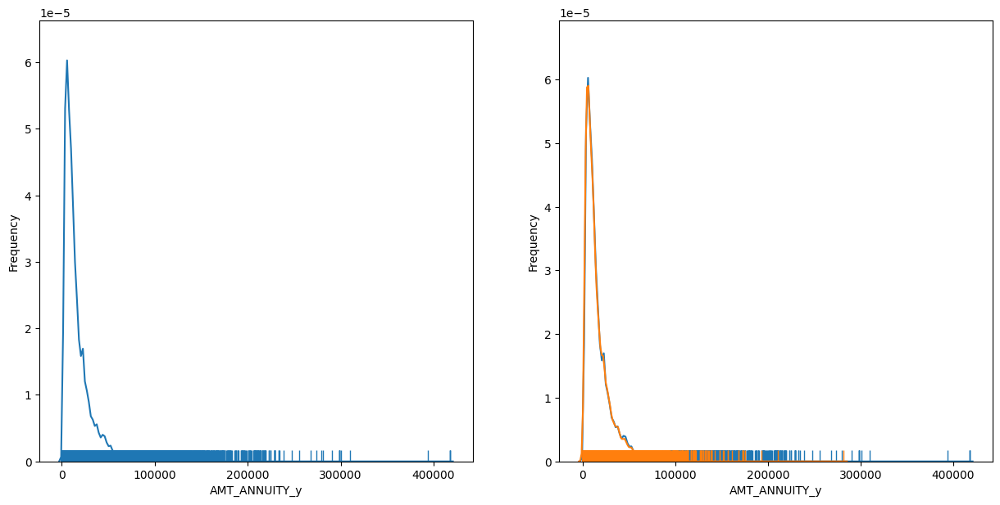

In [122]:
# DistPlots для AMT_ANNUITY_y
distribution_plot_previous("AMT_ANNUITY_y")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Из предыдущих данных очевидно, что размер аннуитета сосредоточен на отметке около 10000.

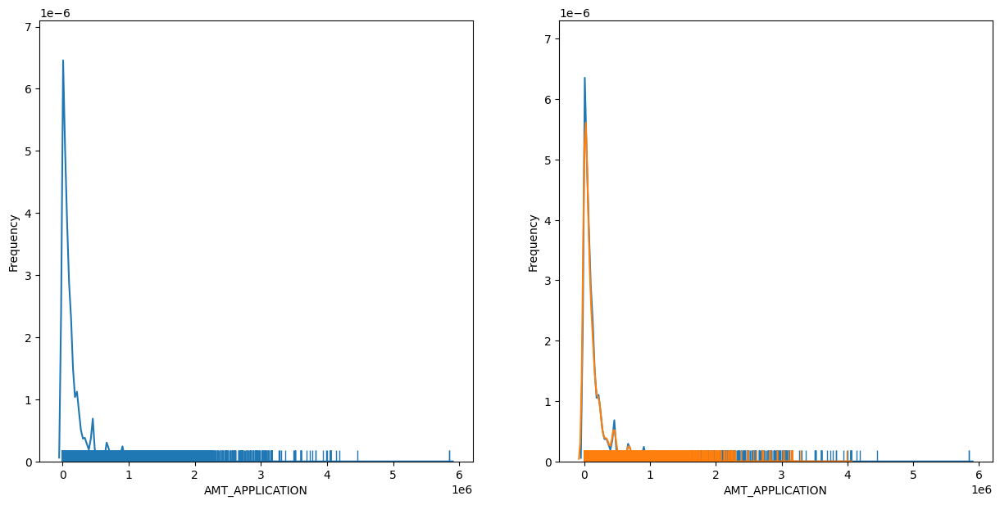

In [123]:
# DistPlots для AMT_APPLICATION
distribution_plot_previous("AMT_APPLICATION")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Сумма кредита, запрашиваемая клиентами обоих целевых типов, в основном составляет около 100000. 
2. Пиковое значение TARGET=1 выше, чем TARGET=0, что говорит о том, что клиентов больше примерно на 100000.

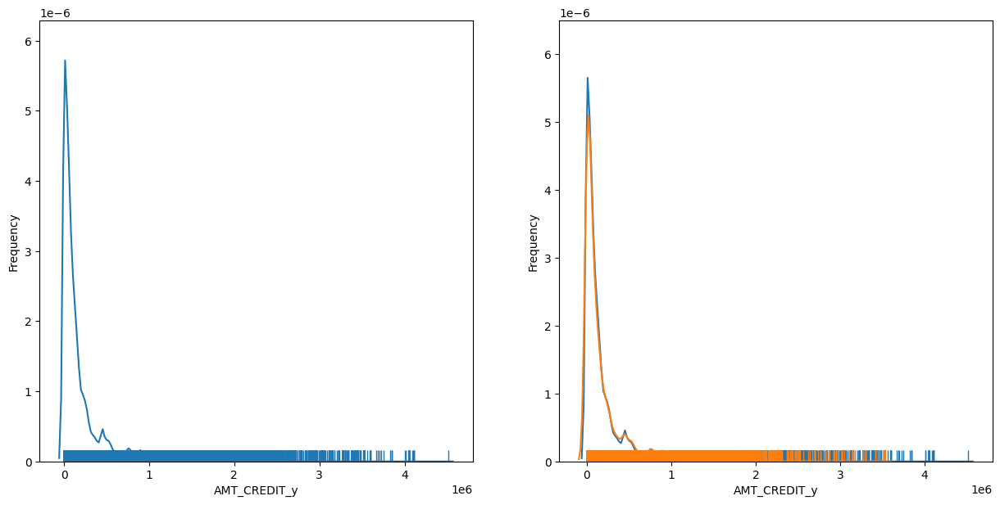

In [124]:
# DistPlots для AMT_CREDIT_y
distribution_plot_previous("AMT_CREDIT_y")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Суммы кредитов сосредоточены на отметке около 100000.
2. Оба целевых типа имеют схожее распределение.

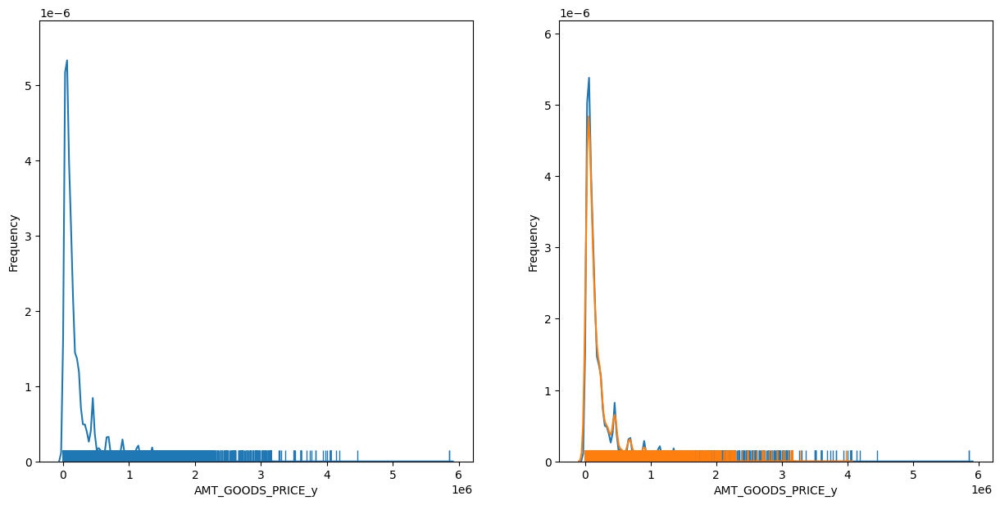

In [125]:
# DistPlots для AMT_GOODS_PRICE_y
distribution_plot_previous("AMT_GOODS_PRICE_y")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Цена товара сосредоточена на отметке около 100000.
2. Оба целевых типа имеют схожее распределение.

In [126]:
# Определение функции для численно-категориального анализа переменных для "объединенных данных"
def NUMCAT_ANALYSIS_Pre(CATVAR, NUMVAR, rot = False):
    
    plt.figure(figsize=[15,7])
    if rot:
        plt.xticks(rotation = 90)
    sns.boxplot(data = merged_data, x=CATVAR, y= NUMVAR, hue = "TARGET")

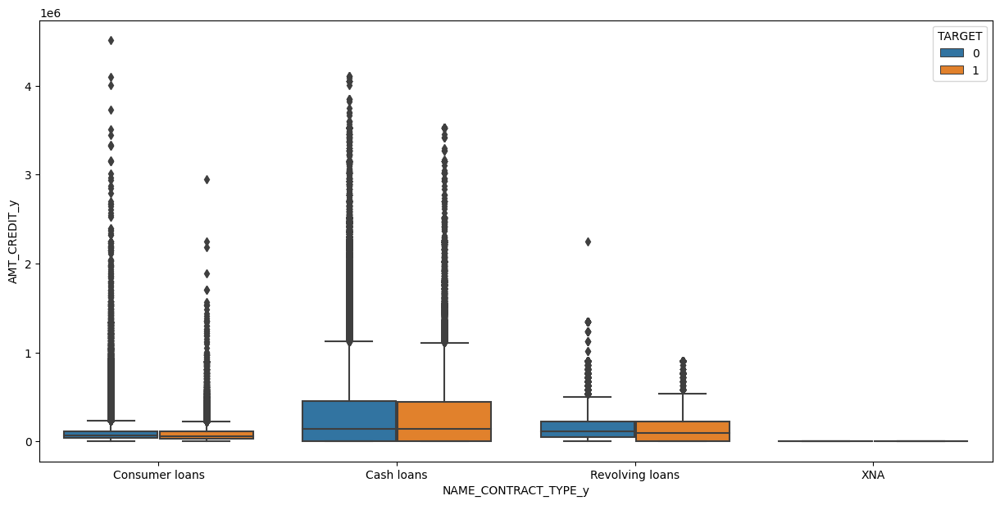

In [127]:
# Блок-схемы для NAME_CONTRACT_TYPE_y против AMT_CREDIT_y
NUMCAT_ANALYSIS_Pre("NAME_CONTRACT_TYPE_y", "AMT_CREDIT_y")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Клиенты, которые выбрали кредиты наличными, имеют более высокие суммы кредитов по сравнению с другими 2 типами кредитов.
2. Все 3 типа займов, по-видимому, имеют множество отклонений.

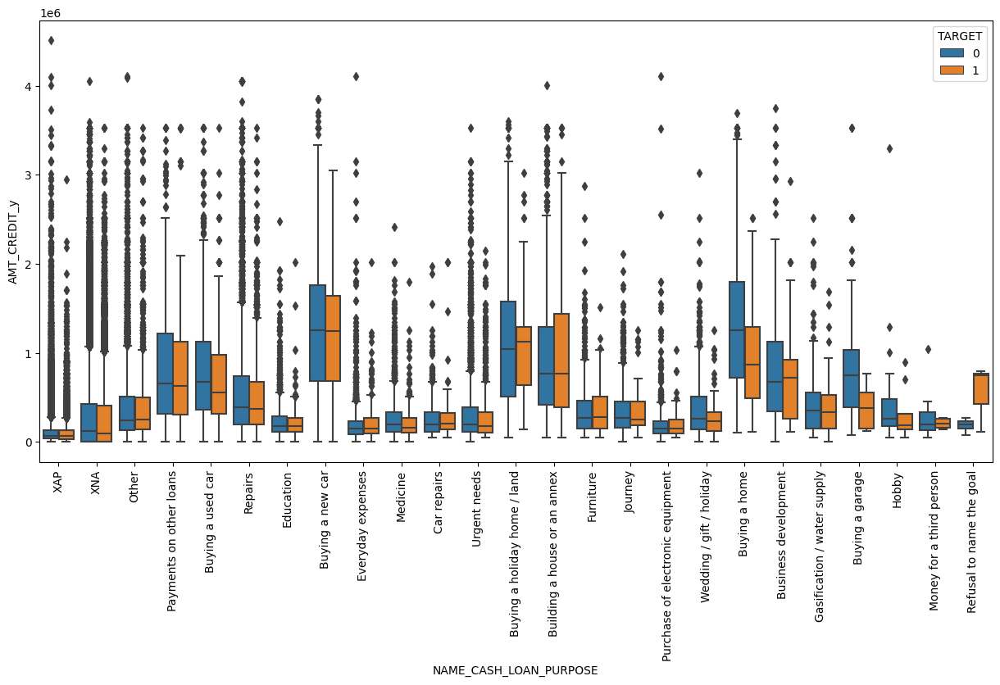

In [128]:
# Блок-схемы для NAME_CASH_LOAN_PURPOSE и AMT_CREDIAMT_CREDIT_y
NUMCAT_ANALYSIS_Pre("NAME_CASH_LOAN_PURPOSE", "AMT_CREDIT_y", rot = True)

### Из приведенных выше графиков можно сделать следующие выводы:
1. Суммы кредитов относительно высоки для покупки автомобиля, покупки загородного дома / земельного участка, покупки дома и приобретения жилплощади.
2. Когда клиенты отказываются назвать цель, они не выполняют обязательства по большим суммам кредита по сравнению с неплательщиками в той же категории.

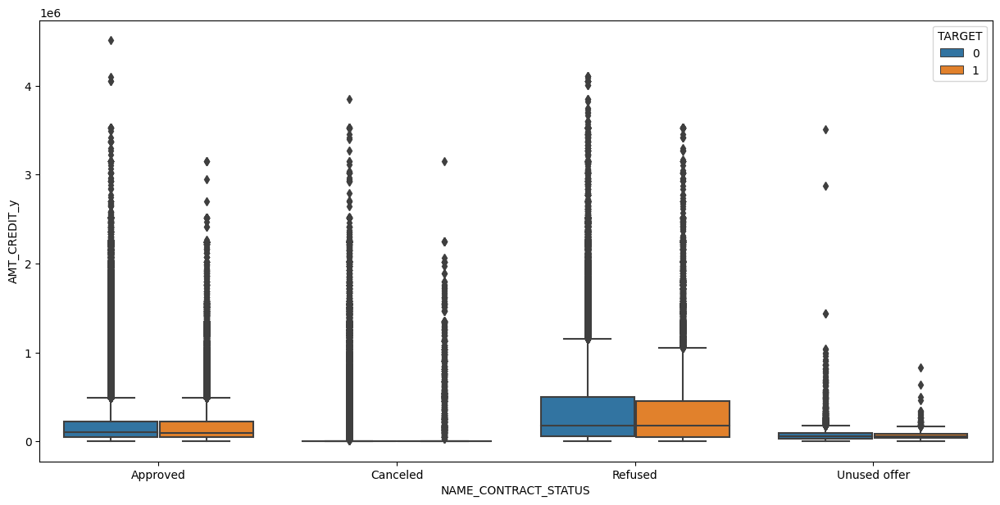

In [129]:
# BoxPlots для NAME_CONTRACT_STATUS и AMT_CREDIT_y
NUMCAT_ANALYSIS_Pre("NAME_CONTRACT_STATUS", "AMT_CREDIT_y")

### Из приведенных выше графиков можно сделать следующие выводы:
1. В выдаче кредитов было отказано, скорее всего, из-за того, что клиенты требовали большие суммы кредита, о чем свидетельствует более высокий коэффициент полезного действия (IQR).

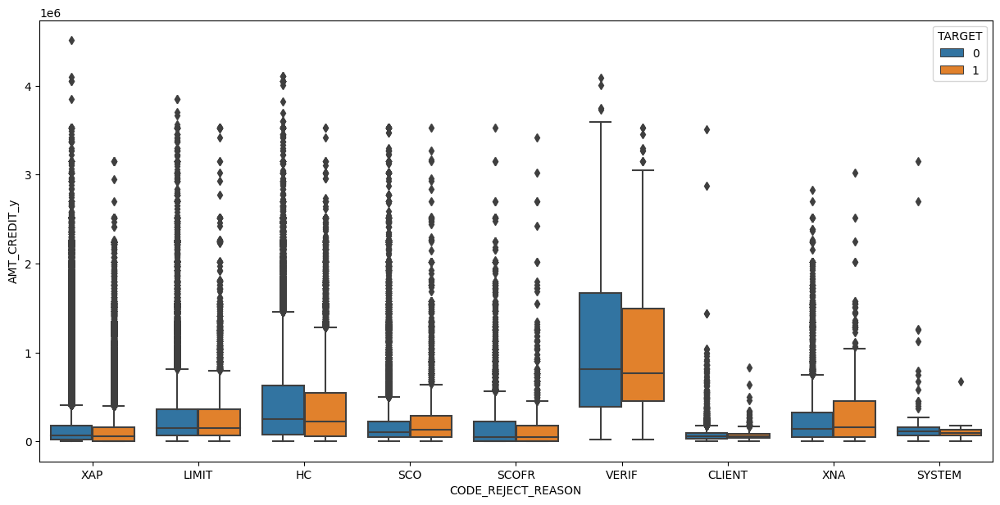

In [130]:
# BoxPlots для CODE_REJECT_REASON и AMT_CREDIT_y
NUMCAT_ANALYSIS_Pre("CODE_REJECT_REASON", "AMT_CREDIT_y")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Клиенты, относящиеся к категории VERIFY, имеют относительно высокую сумму кредита, что видно из IQR.

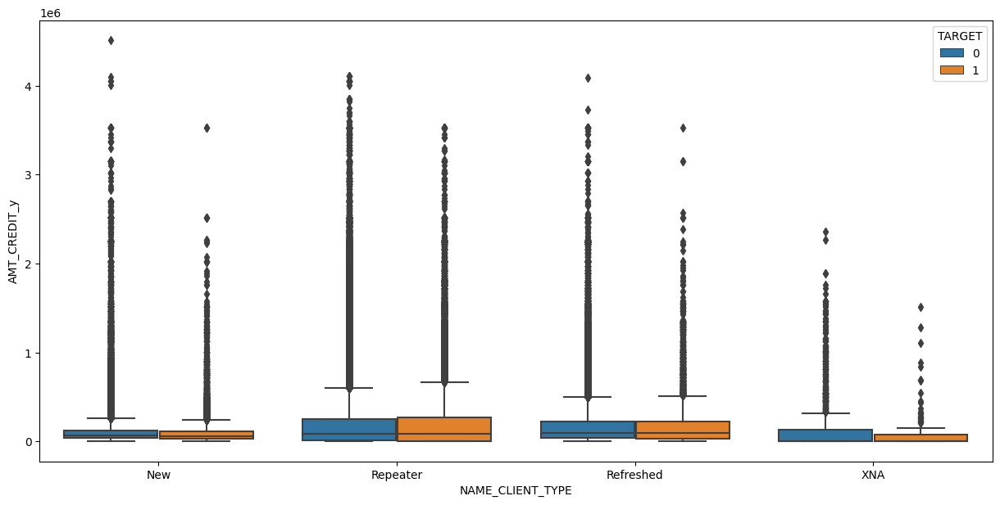

In [131]:
# BoxPlots для NAME_CLIENT_TYPE и AMT_CREDIT_y
NUMCAT_ANALYSIS_Pre("NAME_CLIENT_TYPE", "AMT_CREDIT_y")

### Из приведенных выше графиков можно сделать следующие выводы:
1. Похоже, что новым клиентам предлагается меньшая сумма кредита по сравнению со старыми клиентами, если сравнивать IQR.

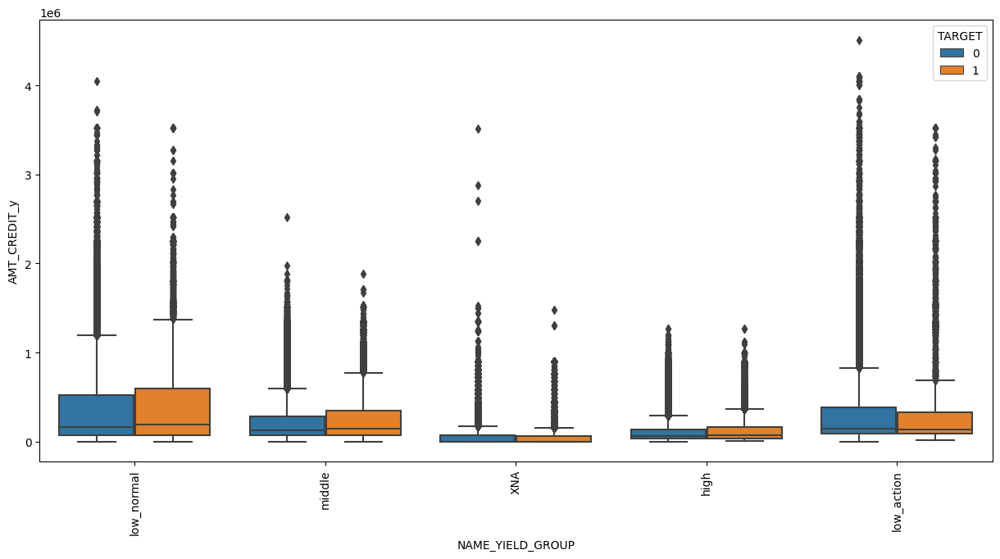

In [132]:
# BoxPlots для NAME_YIELD_GROUP и AMT_CRAMT_CREDIT_yEDIT
NUMCAT_ANALYSIS_Pre("NAME_YIELD_GROUP", "AMT_CREDIT_y", rot = True)

### Из приведенных выше графиков можно сделать следующие выводы:
1. Очевидно, что когда клиентам предлагаются более высокие суммы кредита, их процентная ставка относительно ниже по сравнению с более низкими суммами кредита.
2. Следовательно, чем выше сумма кредита, тем меньше процентная ставка.

In [133]:
# Создание списка важных категориальных переменных
LIST_P = ["NAME_CONTRACT_TYPE_x", "CODE_GENDER", "FLAG_OWN_CAR", "FLAG_OWN_REALTY","NAME_TYPE_SUITE", "NAME_INCOME_TYPE", "NAME_EDUCATION_TYPE", "NAME_FAMILY_STATUS", "NAME_HOUSING_TYPE", "NAME_CLIENT_TYPE","NAME_YIELD_GROUP", "CNT_CHILDREN"]

In [134]:
# Определение функции для анализа "NAME_CONTRACT_STATUS" по категориальным переменным.
def CAT_CAT_ANALYSIS_Prev(LIST_P, rot = False):
    for i in range(1, len(LIST_P)):
        res = pd.pivot_table(data = merged_data, index = LIST_P[i], columns= 'NAME_CONTRACT_STATUS', values = "TARGET")
        plt.figure(figsize=[20,100])
        plt.subplot(len(LIST_P), 1, i)
        plt.subplots_adjust(hspace= 0.5)
        sns.heatmap(data = res, annot = True, cmap = "coolwarm")
        if rot:
            plt.xticks(rotation = 90)
        plt.show()

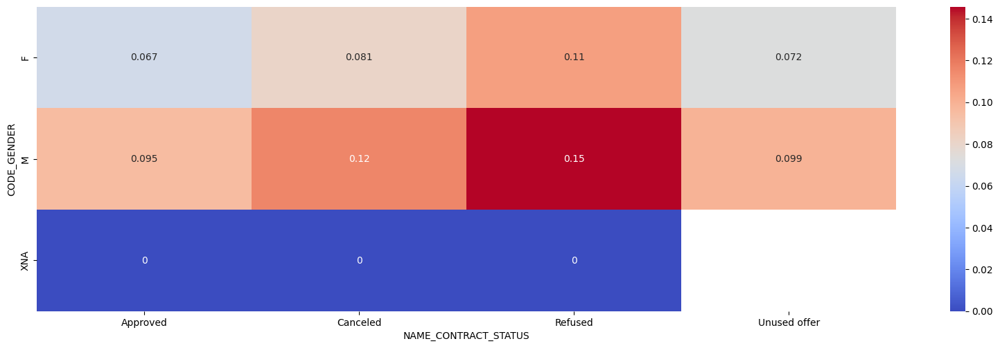

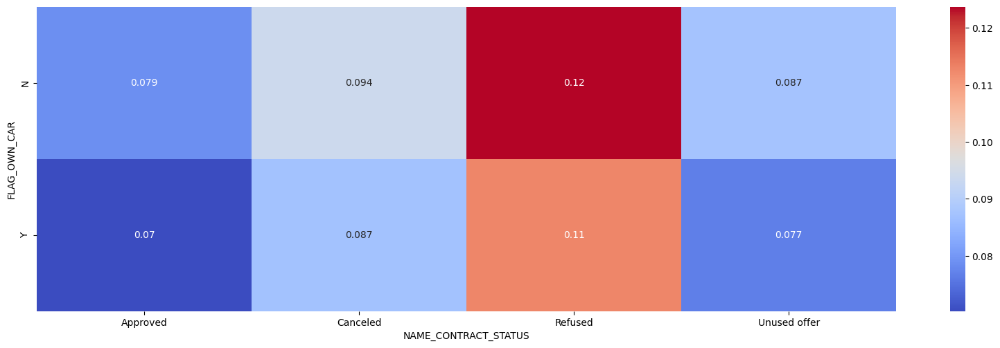

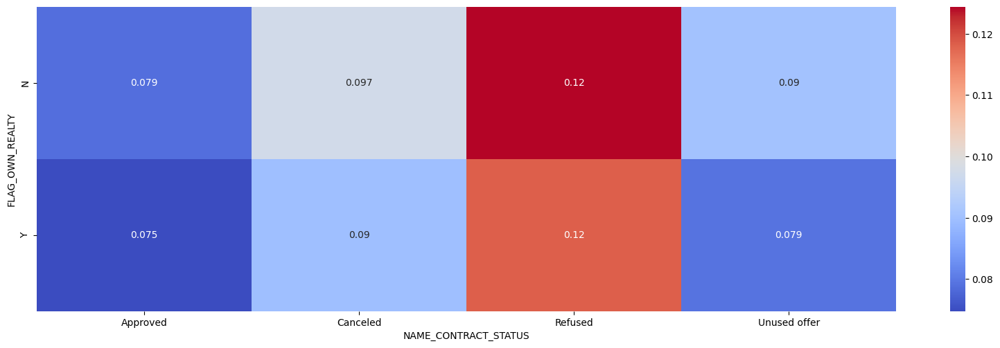

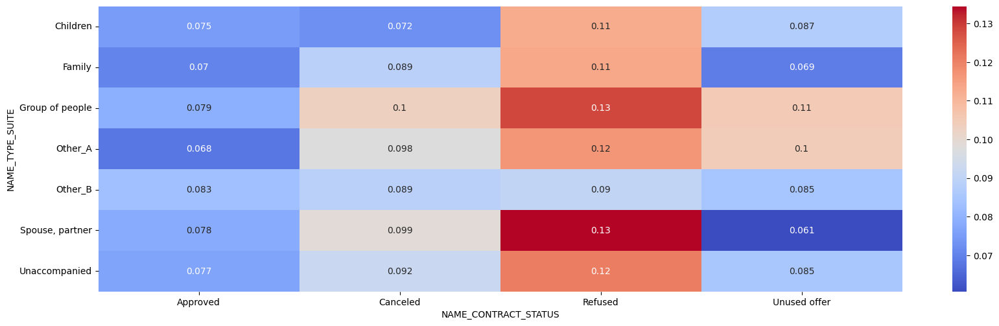

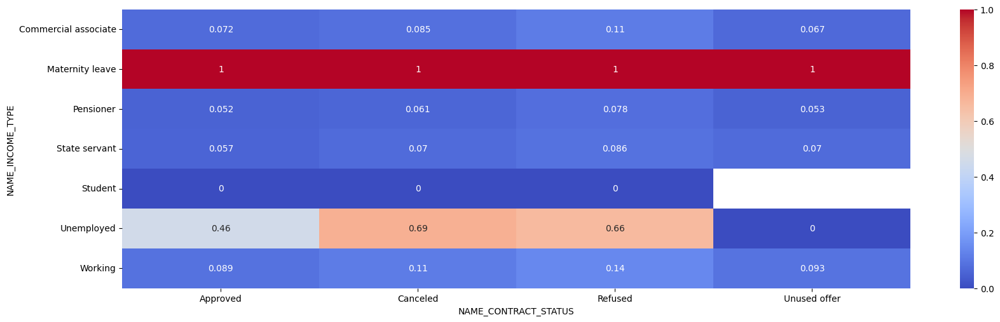

...

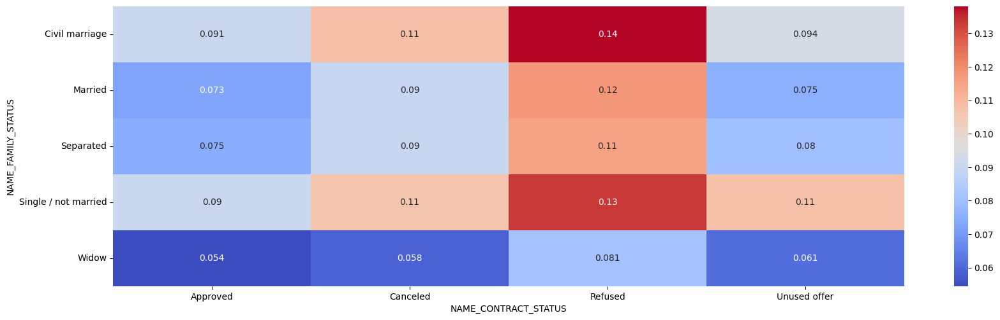

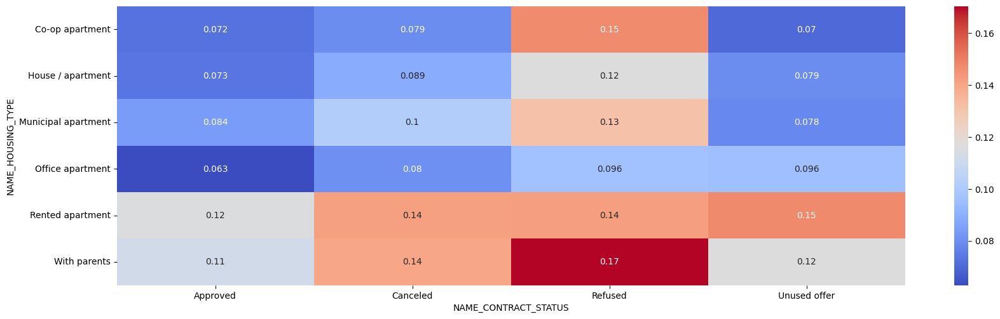

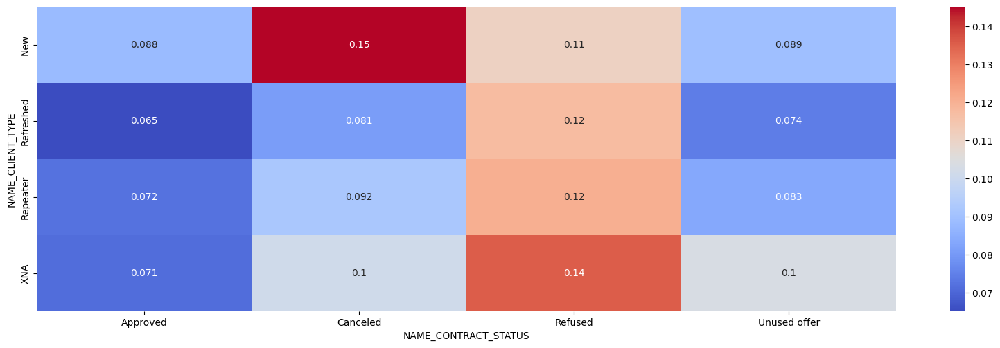

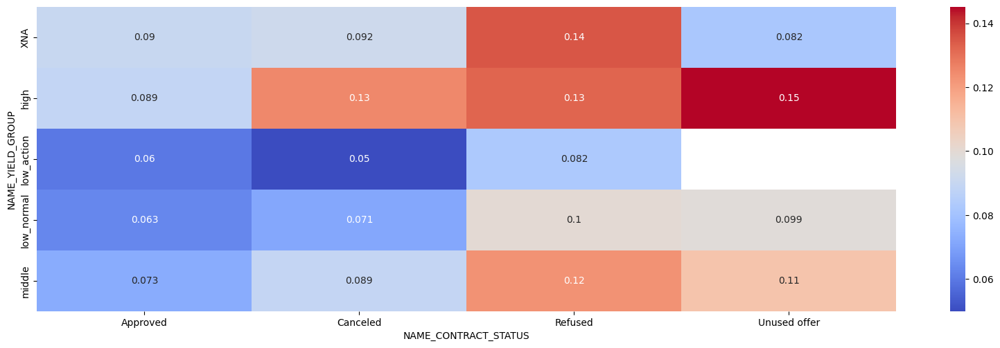

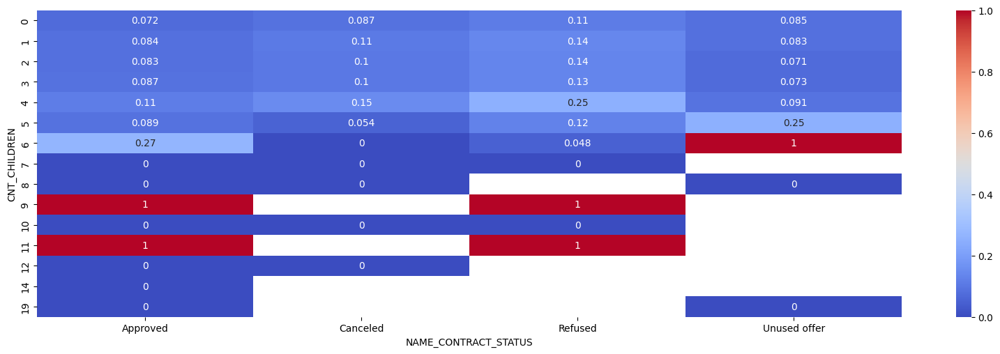

In [135]:
CAT_CAT_ANALYSIS_Prev(LIST_P)

### Мы составили приведенные выше heatmap для анализа статуса контракта, который доступен в предыдущих данных, в сопоставлении с важными категориальными переменными, ниже приведены выводы.

1. Клиент мужского пола, которому отказано в статусе контрактника, с большей вероятностью допустит дефолт.
2. Как правило, клиенты, которым отказано в статусе контракта, с большей вероятностью допустят дефолт.
3. Клиенты, находящиеся в декретном отпуске, с большей вероятностью допустят дефолт независимо от статуса контракта 
4. Безработные клиенты, чей контрактный статус отклонен или аннулирован, с большей вероятностью допустят дефолт.
5. Клиенты, имеющие академическую степень, чей статус контракта - неиспользованное предложение, с большей вероятностью допустят дефолт.
6. Клиенты, которым отказано в контрактном статусе, более склонны к неисполнению обязательств независимо от семейного положения, за исключением вдов.
7. Клиенты, проживающие с родителями, которым отказано в предоставлении статуса по контракту, с большей вероятностью допустят дефолт.
8. Новые клиенты, имеющие статус контракта "Расторгнут", с большей вероятностью допустят дефолт.
9. Клиенты, которые имеют высокую процентную ставку по своим кредитам и имеют статус контракта "Неиспользованное предложение", с большей вероятностью допустят дефолт.
10. Клиенты с 6 детьми и неиспользованным предложением, скорее всего, допустят дефолт, как мы видели ранее, клиенты с 9 или 11 детьми имеют самый высокий процент дефолтов.
11. Клиенты, у которых больше детей, с большей вероятностью допустят дефолт независимо от статуса контракта.
12. Клиенты, которые являются агентами по недвижимости и которых сопровождает группа людей при подаче заявки на получение кредита, с наибольшей вероятностью допустят дефолт.

**Кого следует избегать:**
1. В целом клиенты, находящиеся в декретном отпуске, с большей вероятностью допустят дефолт.
2. В целом безработные клиенты с большей вероятностью допустят дефолт.
3. В целом клиенты, у которых относительно больше детей, с большей вероятностью допустят дефолт.
4. Безработные клиенты мужского пола, которые выбрали кредиты наличными / имеют относительно большее количество детей, более склонны к дефолту.
5. Клиенты, имеющие неполное среднее образование/живущие в съемной квартире/ с родителями, более склонны к дефолту.
6. Клиенты мужского пола, которые относительно моложе / являются низкоквалифицированными работниками / имеют большее количество членов семьи, более склонны к дефолту.
    
**Хорошие кандидаты для одобрения им кредита:**
1. Клиенты, выбравшие возобновляемые кредиты, с меньшей вероятностью допустят дефолт.
2. Клиенты со статусом контракта "Одобрен" с меньшей вероятностью допустят дефолт независимо от других переменных.
3. Клиенты, которые являются бизнесменами или студентами, менее склонны к дефолту.
4. Клиенты с академической степенью менее склонны к дефолту.
5. Клиенты, проживающие в офисной квартире, с меньшей вероятностью допустят дефолт.
